In [1]:
# Imports.
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

tfd = tf.contrib.distributions

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



In [2]:
# Model & Plotting.

neurons = 256

# Encoder.
def make_encoder(data, code_size):
    x = tf.layers.flatten(data)
    h1 = tf.layers.dense(x, neurons, tf.nn.relu)
    h2 = tf.layers.dense(h1, neurons, tf.nn.relu)
    loc = tf.layers.dense(h2, code_size, tf.nn.tanh)
    scl = tf.layers.dense(h2, code_size, tf.nn.softplus)
    return tfd.MultivariateNormalDiag(loc, scl)

# Prior.
def make_prior(code_size):
    loc = tf.zeros(code_size)
    scl = tf.ones(code_size)
    return tfd.MultivariateNormalDiag(loc, scl)

# Decoder
def make_decoder(code, data_shape):
    x = code
    h1 = tf.layers.dense(x, neurons, tf.nn.relu)
    h2 = tf.layers.dense(h1, neurons, tf.nn.relu)
    loc = tf.layers.dense(h2, np.prod(data_shape), tf.nn.softplus)
    scl = tf.layers.dense(h2, np.prod(data_shape), tf.nn.softplus)
    
    return loc, scl

# Optimisation
make_encoder = tf.make_template('encoder', make_encoder)
make_decoder = tf.make_template('decoder', make_decoder)

In [3]:
# Dataset retrieval.
X_train = np.load('FireEvac_train_set.npy')
X_test = np.load('FireEvac_test_set.npy')


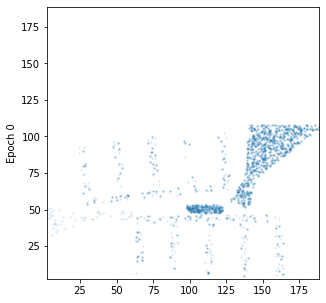

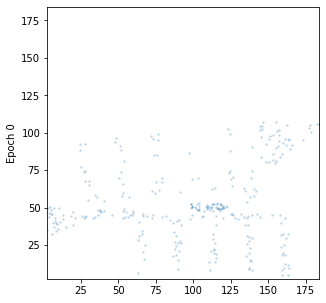

In [4]:
# Plotting.
def plot(epoch, codes, size=2):
    ig, ax = plt.subplots(ncols=1, figsize=(size, size))
    no_ticks = dict(left='off', bottom='off', labelleft='off', labelbottom='off')
    ax.set_ylabel('Epoch {}'.format(epoch))
    ax.scatter(codes[:, 0], codes[:, 1], s=2, alpha=0.1)
    ax.set_aspect('equal')
    ax.set_xlim(codes.min() - .1, codes.max() + .1)
    ax.set_ylim(codes.min() - .1, codes.max() + .1)
    ax.tick_params(axis='both', which='both', **no_ticks)
    plt.show()
    
plot(0, X_train, size=5)
plot(0, X_test, size=5)

In [5]:
data = tf.placeholder(tf.float32, [None, 2])

cs = 10

# Define the model.
prior = make_prior(code_size=cs)
posterior = make_encoder(data, code_size=cs)
code = posterior.sample()

# Define the loss.
loc, scl = make_decoder(code, [2])

mvn = tfd.Independent(tfd.MultivariateNormalDiag(loc, scl))
likelihood = mvn.log_prob(data)

divergence = tfd.kl_divergence(posterior, prior)
elbo = tf.reduce_mean(likelihood - .5*divergence)
optimize = tf.train.AdamOptimizer(0.001).minimize(-elbo)

Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.contrib.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.contrib.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlo

Epoch 0 elbo -15406.231


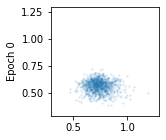

Reconstruction:


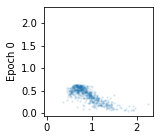

Epoch 1 elbo -12.791792


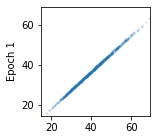

Reconstruction:


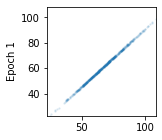

Epoch 2 elbo -12.194483


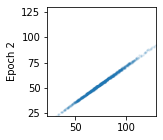

Reconstruction:


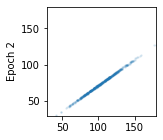

Epoch 3 elbo -12.289339


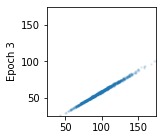

Reconstruction:


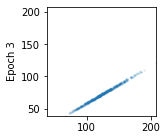

Epoch 4 elbo -12.199331


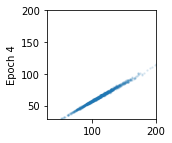

Reconstruction:


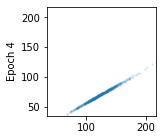

Epoch 5 elbo -11.711263


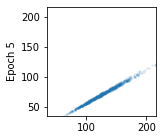

Reconstruction:


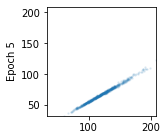

Epoch 6 elbo -11.743494


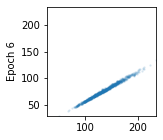

Reconstruction:


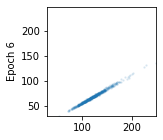

Epoch 7 elbo -11.462914


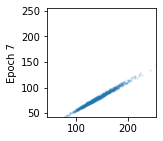

Reconstruction:


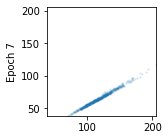

Epoch 8 elbo -11.495652


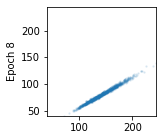

Reconstruction:


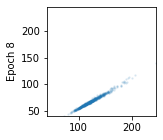

Epoch 9 elbo -11.580159


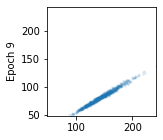

Reconstruction:


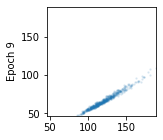

Epoch 10 elbo -11.346629


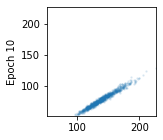

Reconstruction:


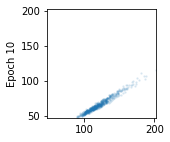

Epoch 11 elbo -11.106952


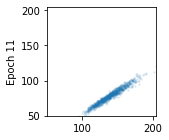

Reconstruction:


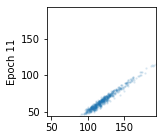

Epoch 12 elbo -10.956644


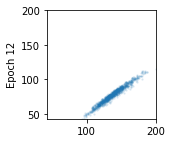

Reconstruction:


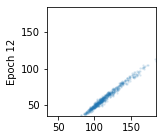

Epoch 13 elbo -11.573159


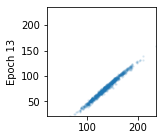

Reconstruction:


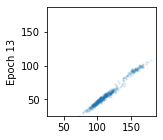

Epoch 14 elbo -10.663288


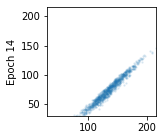

Reconstruction:


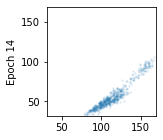

Epoch 15 elbo -10.939039


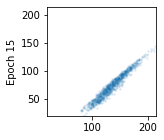

Reconstruction:


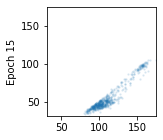

Epoch 16 elbo -10.318172


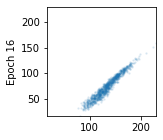

Reconstruction:


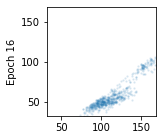

Epoch 17 elbo -10.316435


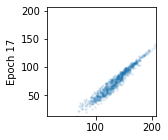

Reconstruction:


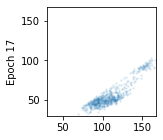

Epoch 18 elbo -10.647707


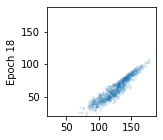

Reconstruction:


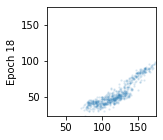

Epoch 19 elbo -10.145111


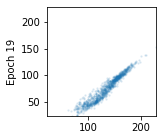

Reconstruction:


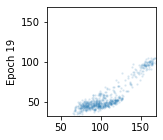

Epoch 20 elbo -10.039507


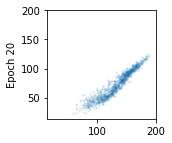

Reconstruction:


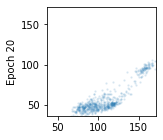

Epoch 21 elbo -10.019635


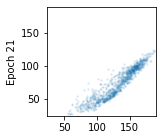

Reconstruction:


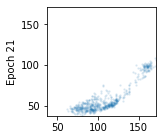

Epoch 22 elbo -9.867572


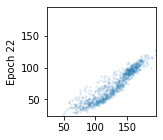

Reconstruction:


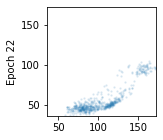

Epoch 23 elbo -9.927948


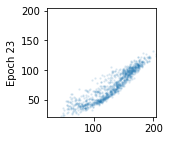

Reconstruction:


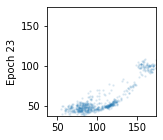

Epoch 24 elbo -10.038715


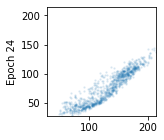

Reconstruction:


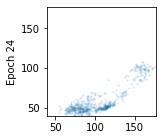

Epoch 25 elbo -9.79624


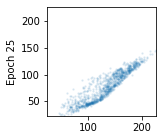

Reconstruction:


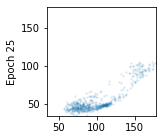

Epoch 26 elbo -9.70486


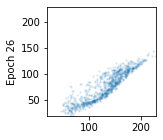

Reconstruction:


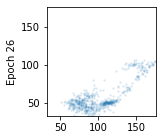

Epoch 27 elbo -9.961034


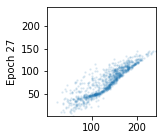

Reconstruction:


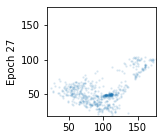

Epoch 28 elbo -9.755778


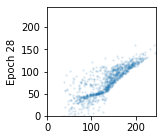

Reconstruction:


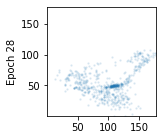

Epoch 29 elbo -9.420041


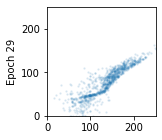

Reconstruction:


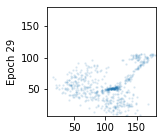

Epoch 30 elbo -9.3583555


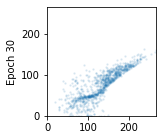

Reconstruction:


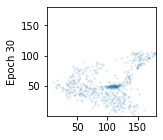

Epoch 31 elbo -9.23103


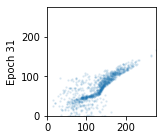

Reconstruction:


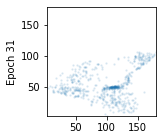

Epoch 32 elbo -9.174823


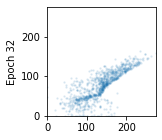

Reconstruction:


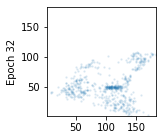

Epoch 33 elbo -9.174424


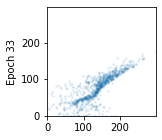

Reconstruction:


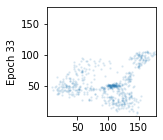

Epoch 34 elbo -8.954225


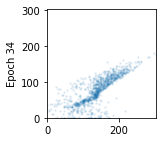

Reconstruction:


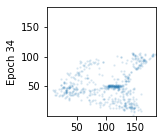

Epoch 35 elbo -8.84989


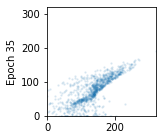

Reconstruction:


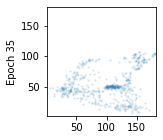

Epoch 36 elbo -8.780843


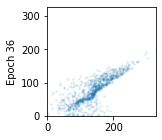

Reconstruction:


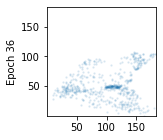

Epoch 37 elbo -8.67796


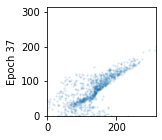

Reconstruction:


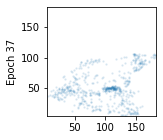

Epoch 38 elbo -9.02486


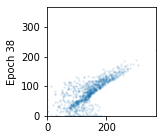

Reconstruction:


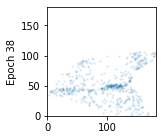

Epoch 39 elbo -8.430205


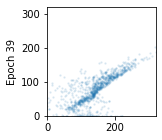

Reconstruction:


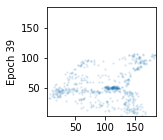

Epoch 40 elbo -8.543989


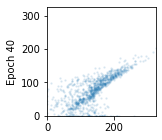

Reconstruction:


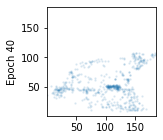

Epoch 41 elbo -8.879315


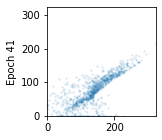

Reconstruction:


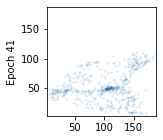

Epoch 42 elbo -8.281045


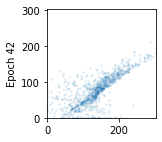

Reconstruction:


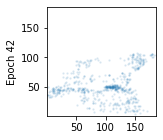

Epoch 43 elbo -8.411219


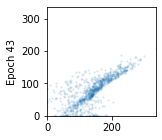

Reconstruction:


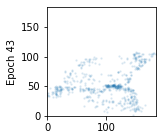

Epoch 44 elbo -8.168945


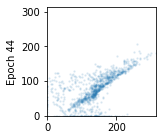

Reconstruction:


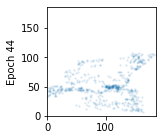

Epoch 45 elbo -8.158603


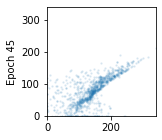

Reconstruction:


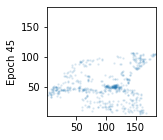

Epoch 46 elbo -8.153337


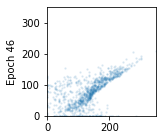

Reconstruction:


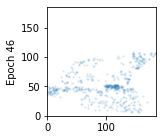

Epoch 47 elbo -9.077268


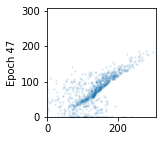

Reconstruction:


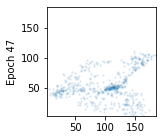

Epoch 48 elbo -7.959249


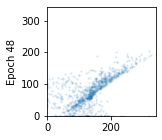

Reconstruction:


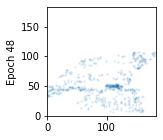

Epoch 49 elbo -8.104412


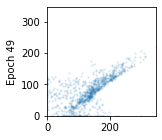

Reconstruction:


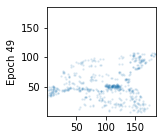

Epoch 50 elbo -8.292257


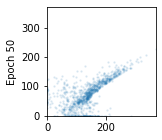

Reconstruction:


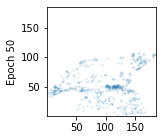

Epoch 51 elbo -8.211011


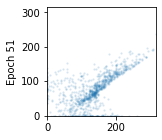

Reconstruction:


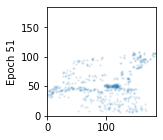

Epoch 52 elbo -8.224618


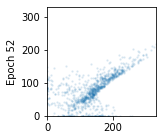

Reconstruction:


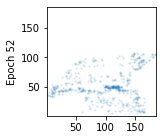

Epoch 53 elbo -8.231802


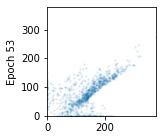

Reconstruction:


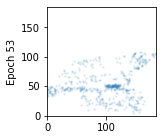

Epoch 54 elbo -9.351475


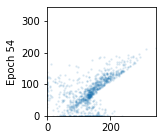

Reconstruction:


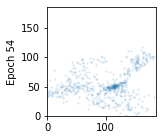

Epoch 55 elbo -8.451957


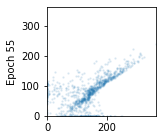

Reconstruction:


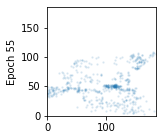

Epoch 56 elbo -8.606785


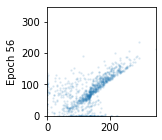

Reconstruction:


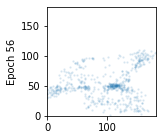

Epoch 57 elbo -10.035969


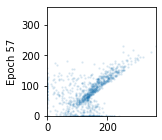

Reconstruction:


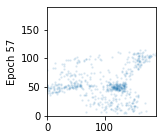

Epoch 58 elbo -7.665768


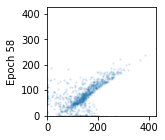

Reconstruction:


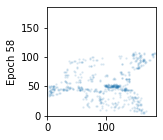

Epoch 59 elbo -9.323981


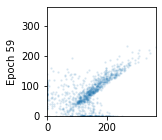

Reconstruction:


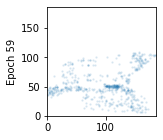

Epoch 60 elbo -7.7310276


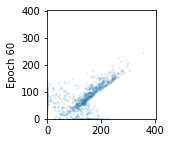

Reconstruction:


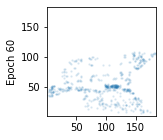

Epoch 61 elbo -8.254509


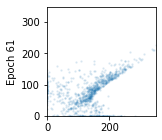

Reconstruction:


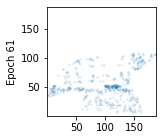

Epoch 62 elbo -8.35799


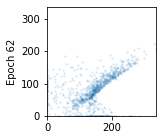

Reconstruction:


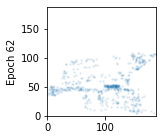

Epoch 63 elbo -7.591865


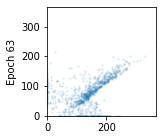

Reconstruction:


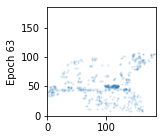

Epoch 64 elbo -8.502451


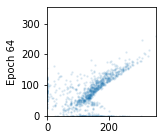

Reconstruction:


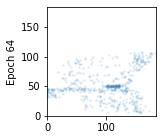

Epoch 65 elbo -8.069949


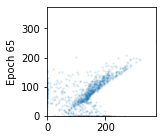

Reconstruction:


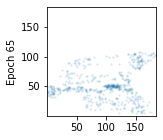

Epoch 66 elbo -7.384706


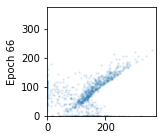

Reconstruction:


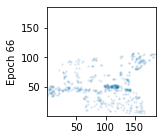

Epoch 67 elbo -8.315985


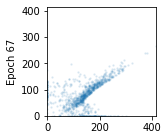

Reconstruction:


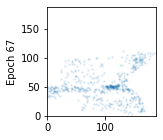

Epoch 68 elbo -7.6543784


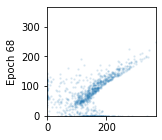

Reconstruction:


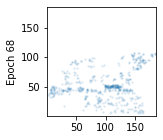

Epoch 69 elbo -7.4201465


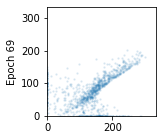

Reconstruction:


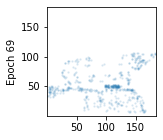

Epoch 70 elbo -7.5459146


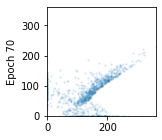

Reconstruction:


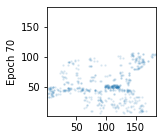

Epoch 71 elbo -7.472092


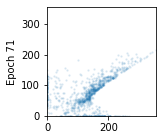

Reconstruction:


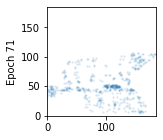

Epoch 72 elbo -8.319771


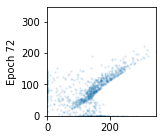

Reconstruction:


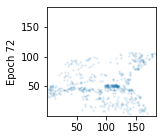

Epoch 73 elbo -7.3320312


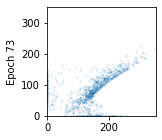

Reconstruction:


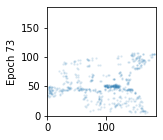

Epoch 74 elbo -7.5766487


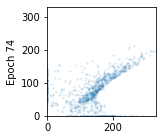

Reconstruction:


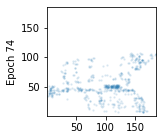

Epoch 75 elbo -9.226299


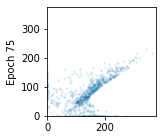

Reconstruction:


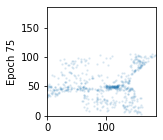

Epoch 76 elbo -7.571517


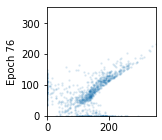

Reconstruction:


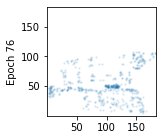

Epoch 77 elbo -7.5781894


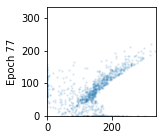

Reconstruction:


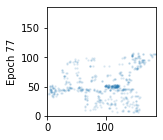

Epoch 78 elbo -7.9684196


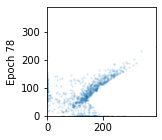

Reconstruction:


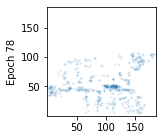

Epoch 79 elbo -7.18797


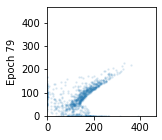

Reconstruction:


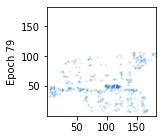

Epoch 80 elbo -7.7018228


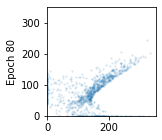

Reconstruction:


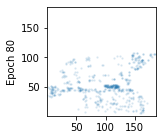

Epoch 81 elbo -7.552308


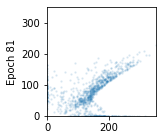

Reconstruction:


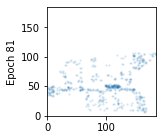

Epoch 82 elbo -7.2628336


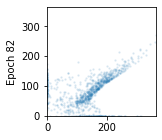

Reconstruction:


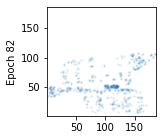

Epoch 83 elbo -7.2558856


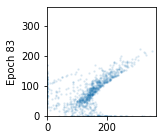

Reconstruction:


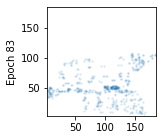

Epoch 84 elbo -7.759973


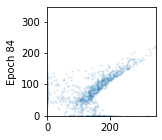

Reconstruction:


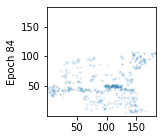

Epoch 85 elbo -7.1376247


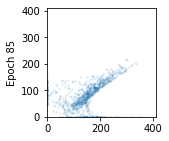

Reconstruction:


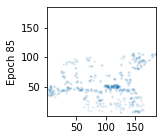

Epoch 86 elbo -7.254353


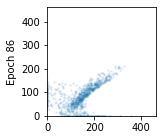

Reconstruction:


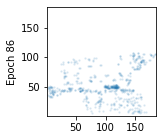

Epoch 87 elbo -7.2472534


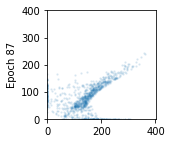

Reconstruction:


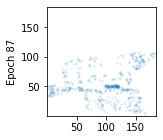

Epoch 88 elbo -7.5107217


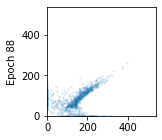

Reconstruction:


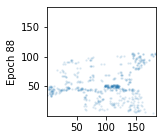

Epoch 89 elbo -7.141728


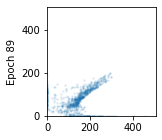

Reconstruction:


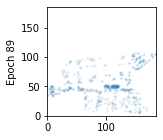

Epoch 90 elbo -7.359214


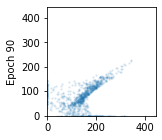

Reconstruction:


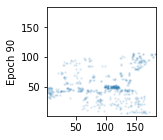

Epoch 91 elbo -7.2836547


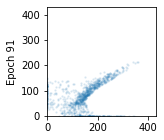

Reconstruction:


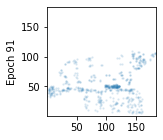

Epoch 92 elbo -7.2217007


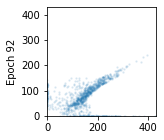

Reconstruction:


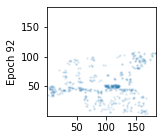

Epoch 93 elbo -7.12763


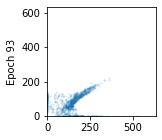

Reconstruction:


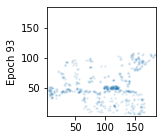

Epoch 94 elbo -7.2237287


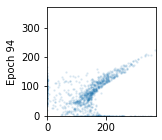

Reconstruction:


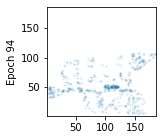

Epoch 95 elbo -7.1125617


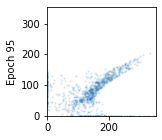

Reconstruction:


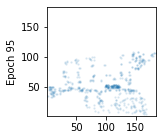

Epoch 96 elbo -8.318017


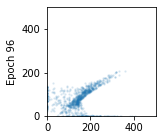

Reconstruction:


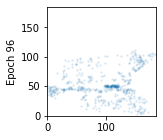

Epoch 97 elbo -7.3548584


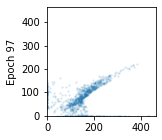

Reconstruction:


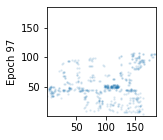

Epoch 98 elbo -7.168761


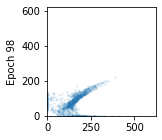

Reconstruction:


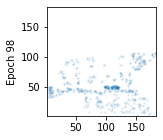

Epoch 99 elbo -7.7072935


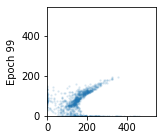

Reconstruction:


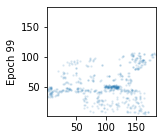

Epoch 100 elbo -7.2643604


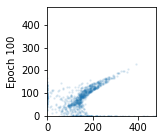

Reconstruction:


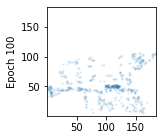

Epoch 101 elbo -6.967292


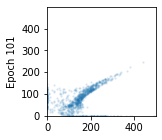

Reconstruction:


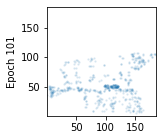

Epoch 102 elbo -6.915122


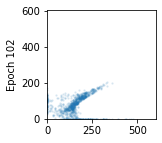

Reconstruction:


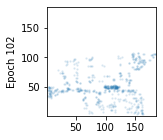

Epoch 103 elbo -7.2432184


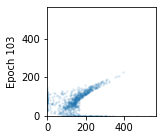

Reconstruction:


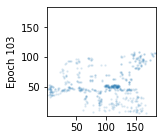

Epoch 104 elbo -7.2810807


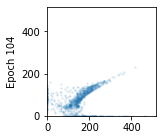

Reconstruction:


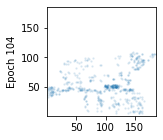

Epoch 105 elbo -6.9993653


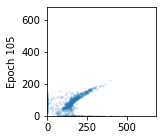

Reconstruction:


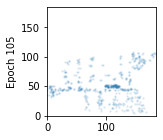

Epoch 106 elbo -8.391447


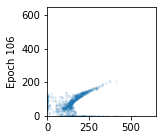

Reconstruction:


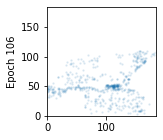

Epoch 107 elbo -8.615527


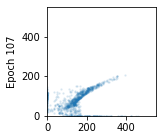

Reconstruction:


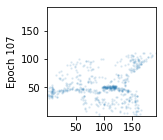

Epoch 108 elbo -7.3354287


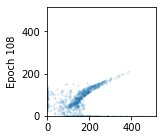

Reconstruction:


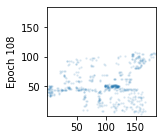

Epoch 109 elbo -7.198636


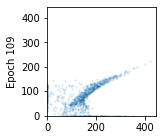

Reconstruction:


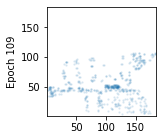

Epoch 110 elbo -7.633698


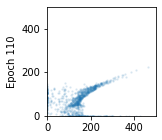

Reconstruction:


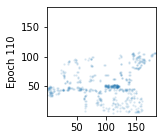

Epoch 111 elbo -8.231661


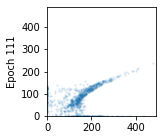

Reconstruction:


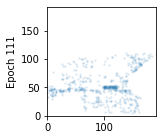

Epoch 112 elbo -9.193823


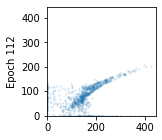

Reconstruction:


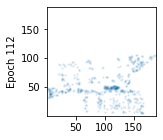

Epoch 113 elbo -10.344166


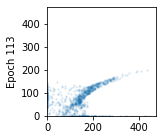

Reconstruction:


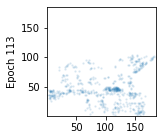

Epoch 114 elbo -8.428941


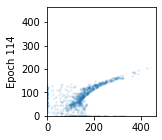

Reconstruction:


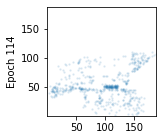

Epoch 115 elbo -6.9991097


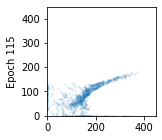

Reconstruction:


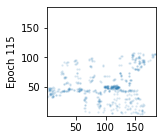

Epoch 116 elbo -7.0446997


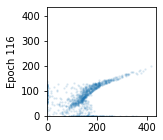

Reconstruction:


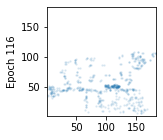

Epoch 117 elbo -7.33823


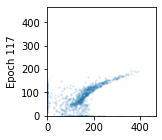

Reconstruction:


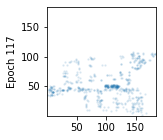

Epoch 118 elbo -6.8160386


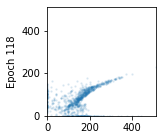

Reconstruction:


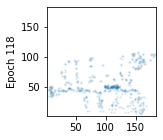

Epoch 119 elbo -6.8456964


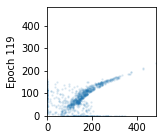

Reconstruction:


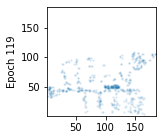

Epoch 120 elbo -6.817663


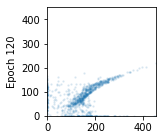

Reconstruction:


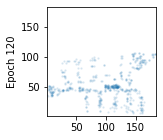

Epoch 121 elbo -6.8899236


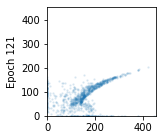

Reconstruction:


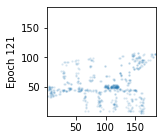

Epoch 122 elbo -7.4861


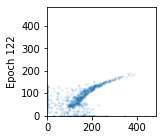

Reconstruction:


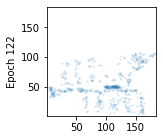

Epoch 123 elbo -8.041447


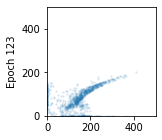

Reconstruction:


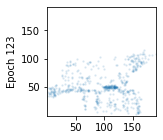

Epoch 124 elbo -7.201872


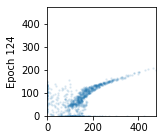

Reconstruction:


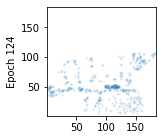

Epoch 125 elbo -6.9477897


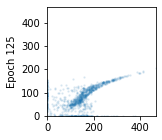

Reconstruction:


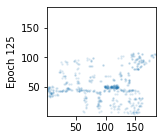

Epoch 126 elbo -7.3524876


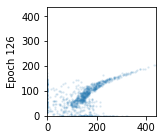

Reconstruction:


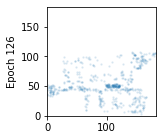

Epoch 127 elbo -6.933171


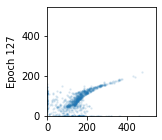

Reconstruction:


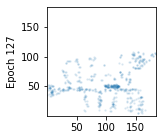

Epoch 128 elbo -8.776558


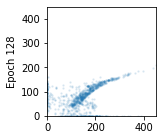

Reconstruction:


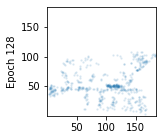

Epoch 129 elbo -6.836375


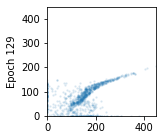

Reconstruction:


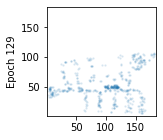

Epoch 130 elbo -7.69375


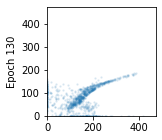

Reconstruction:


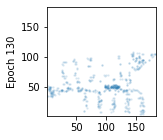

Epoch 131 elbo -7.1877866


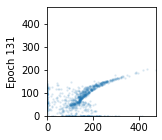

Reconstruction:


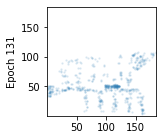

Epoch 132 elbo -6.72513


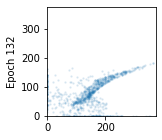

Reconstruction:


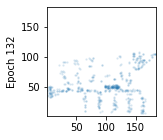

Epoch 133 elbo -7.733874


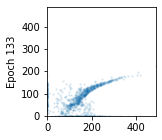

Reconstruction:


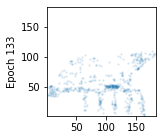

Epoch 134 elbo -6.7147617


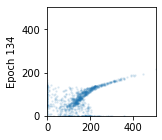

Reconstruction:


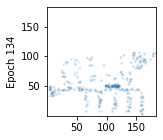

Epoch 135 elbo -6.637457


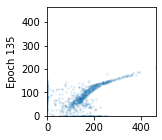

Reconstruction:


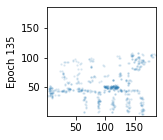

Epoch 136 elbo -6.6334424


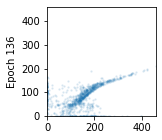

Reconstruction:


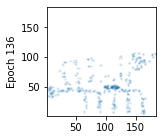

Epoch 137 elbo -8.504541


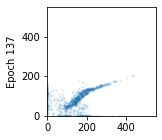

Reconstruction:


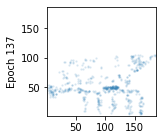

Epoch 138 elbo -6.840567


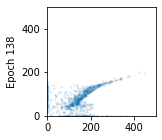

Reconstruction:


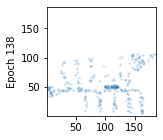

Epoch 139 elbo -6.554622


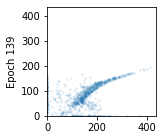

Reconstruction:


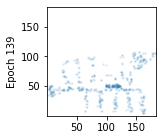

Epoch 140 elbo -6.7567506


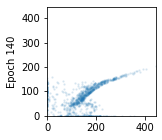

Reconstruction:


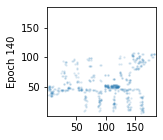

Epoch 141 elbo -7.779709


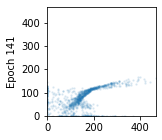

Reconstruction:


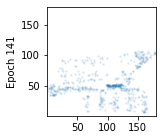

Epoch 142 elbo -7.137472


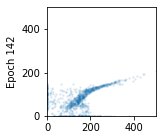

Reconstruction:


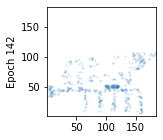

Epoch 143 elbo -6.71987


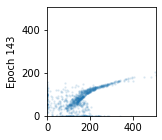

Reconstruction:


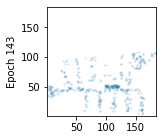

Epoch 144 elbo -7.168859


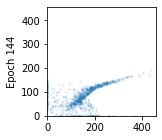

Reconstruction:


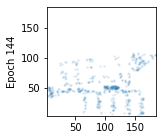

Epoch 145 elbo -8.788434


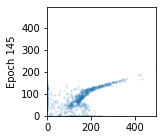

Reconstruction:


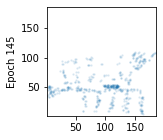

Epoch 146 elbo -7.2222137


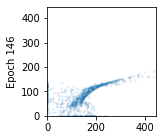

Reconstruction:


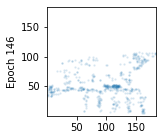

Epoch 147 elbo -7.8627586


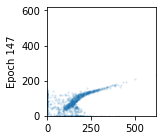

Reconstruction:


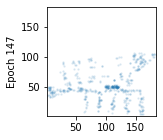

Epoch 148 elbo -6.589177


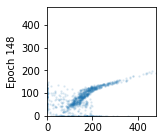

Reconstruction:


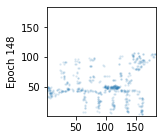

Epoch 149 elbo -6.544683


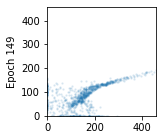

Reconstruction:


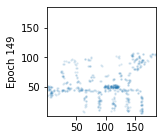

Epoch 150 elbo -6.9266357


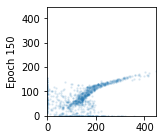

Reconstruction:


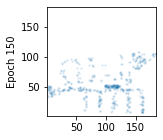

Epoch 151 elbo -6.9696584


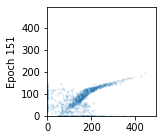

Reconstruction:


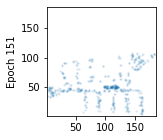

Epoch 152 elbo -7.0676894


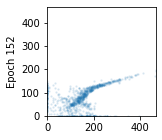

Reconstruction:


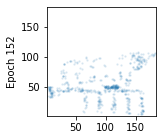

Epoch 153 elbo -6.498262


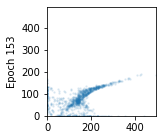

Reconstruction:


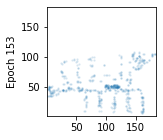

Epoch 154 elbo -7.3306966


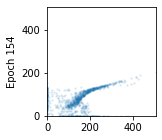

Reconstruction:


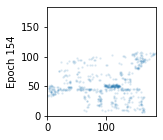

Epoch 155 elbo -7.223773


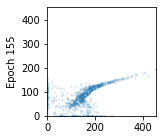

Reconstruction:


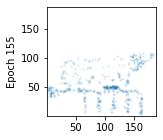

Epoch 156 elbo -8.754956


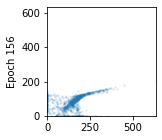

Reconstruction:


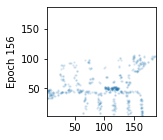

Epoch 157 elbo -6.8584642


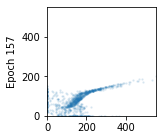

Reconstruction:


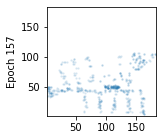

Epoch 158 elbo -6.7240224


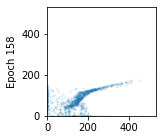

Reconstruction:


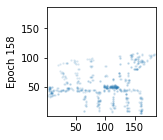

Epoch 159 elbo -6.872326


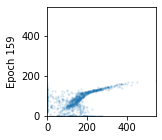

Reconstruction:


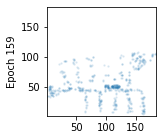

Epoch 160 elbo -6.8653083


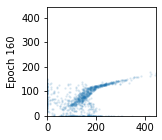

Reconstruction:


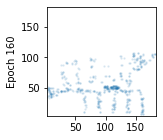

Epoch 161 elbo -7.23524


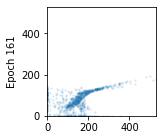

Reconstruction:


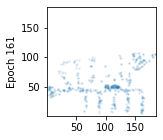

Epoch 162 elbo -6.76197


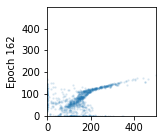

Reconstruction:


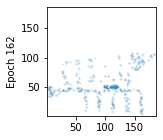

Epoch 163 elbo -6.513308


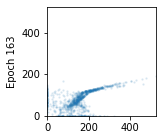

Reconstruction:


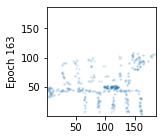

Epoch 164 elbo -7.0344515


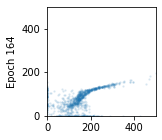

Reconstruction:


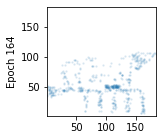

Epoch 165 elbo -6.709249


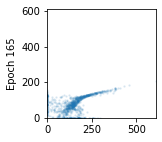

Reconstruction:


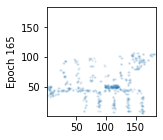

Epoch 166 elbo -7.6088037


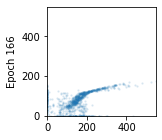

Reconstruction:


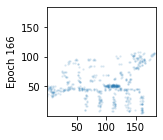

Epoch 167 elbo -7.217513


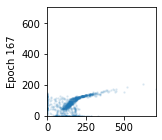

Reconstruction:


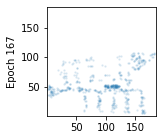

Epoch 168 elbo -6.5887637


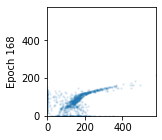

Reconstruction:


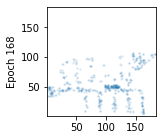

Epoch 169 elbo -7.543231


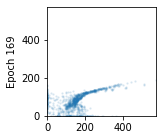

Reconstruction:


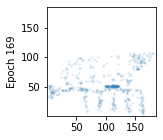

Epoch 170 elbo -6.5403447


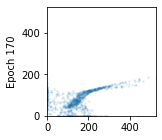

Reconstruction:


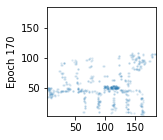

Epoch 171 elbo -8.763536


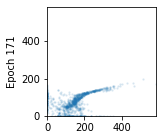

Reconstruction:


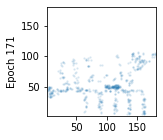

Epoch 172 elbo -6.8986635


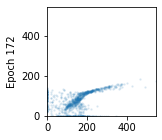

Reconstruction:


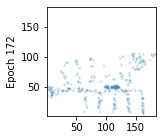

Epoch 173 elbo -6.6491313


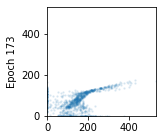

Reconstruction:


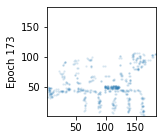

Epoch 174 elbo -6.8889146


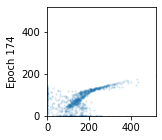

Reconstruction:


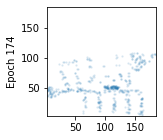

Epoch 175 elbo -6.748509


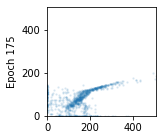

Reconstruction:


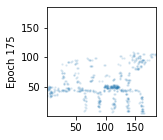

Epoch 176 elbo -6.9480796


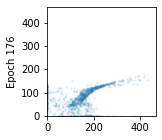

Reconstruction:


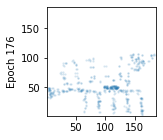

Epoch 177 elbo -6.6247325


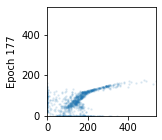

Reconstruction:


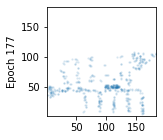

Epoch 178 elbo -6.8781705


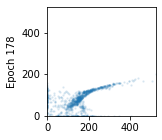

Reconstruction:


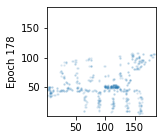

Epoch 179 elbo -7.3656573


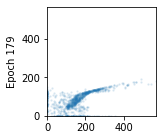

Reconstruction:


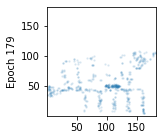

Epoch 180 elbo -7.145989


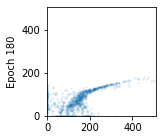

Reconstruction:


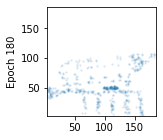

Epoch 181 elbo -9.138666


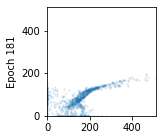

Reconstruction:


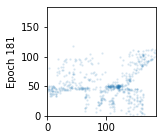

Epoch 182 elbo -6.643503


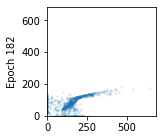

Reconstruction:


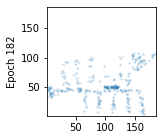

Epoch 183 elbo -6.7202997


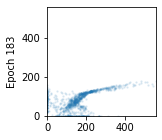

Reconstruction:


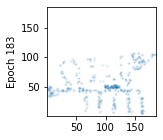

Epoch 184 elbo -6.7210455


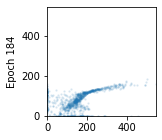

Reconstruction:


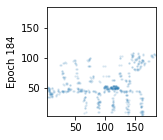

Epoch 185 elbo -7.9411


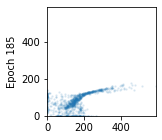

Reconstruction:


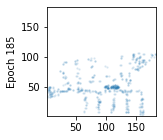

Epoch 186 elbo -7.074813


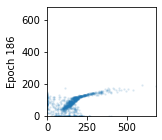

Reconstruction:


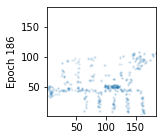

Epoch 187 elbo -6.639958


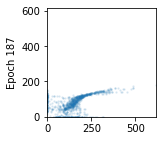

Reconstruction:


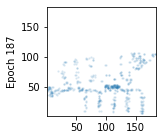

Epoch 188 elbo -6.580132


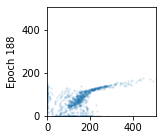

Reconstruction:


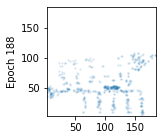

Epoch 189 elbo -7.808116


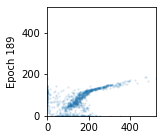

Reconstruction:


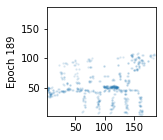

Epoch 190 elbo -7.7066226


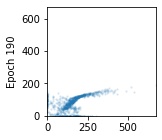

Reconstruction:


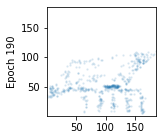

Epoch 191 elbo -10.085493


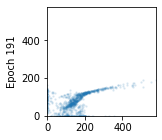

Reconstruction:


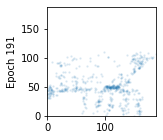

Epoch 192 elbo -7.1563153


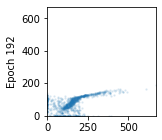

Reconstruction:


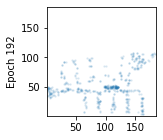

Epoch 193 elbo -8.002639


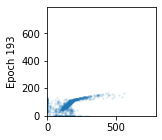

Reconstruction:


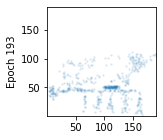

Epoch 194 elbo -6.6030927


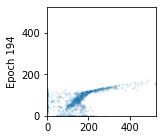

Reconstruction:


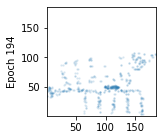

Epoch 195 elbo -6.65501


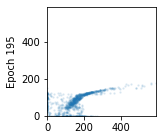

Reconstruction:


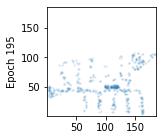

Epoch 196 elbo -7.0307355


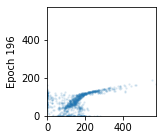

Reconstruction:


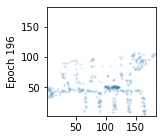

Epoch 197 elbo -6.6284065


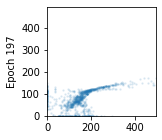

Reconstruction:


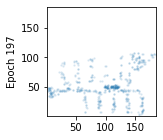

Epoch 198 elbo -6.9297705


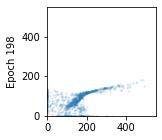

Reconstruction:


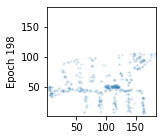

Epoch 199 elbo -7.07118


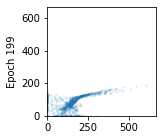

Reconstruction:


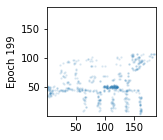

Epoch 200 elbo -6.7751923


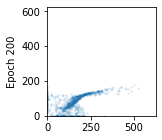

Reconstruction:


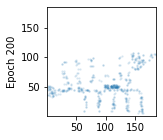

Epoch 201 elbo -7.2620974


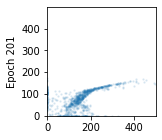

Reconstruction:


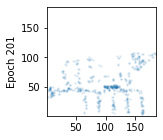

Epoch 202 elbo -6.5086403


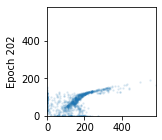

Reconstruction:


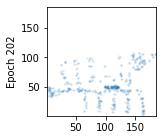

Epoch 203 elbo -7.862285


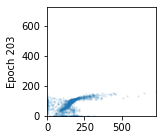

Reconstruction:


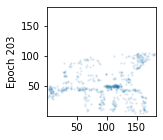

Epoch 204 elbo -6.5523543


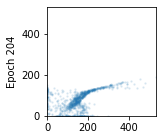

Reconstruction:


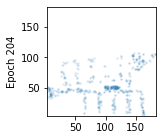

Epoch 205 elbo -6.705283


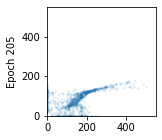

Reconstruction:


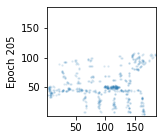

Epoch 206 elbo -7.6145663


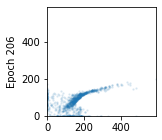

Reconstruction:


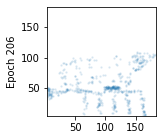

Epoch 207 elbo -6.7987385


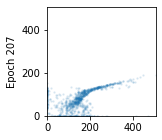

Reconstruction:


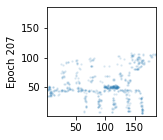

Epoch 208 elbo -6.507893


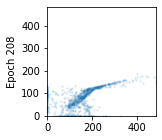

Reconstruction:


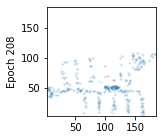

Epoch 209 elbo -6.9515643


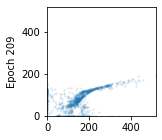

Reconstruction:


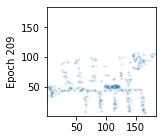

Epoch 210 elbo -7.184734


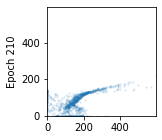

Reconstruction:


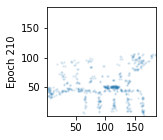

Epoch 211 elbo -7.370177


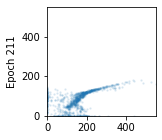

Reconstruction:


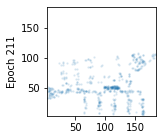

Epoch 212 elbo -6.8059745


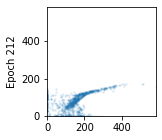

Reconstruction:


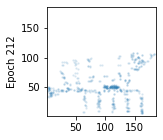

Epoch 213 elbo -7.185623


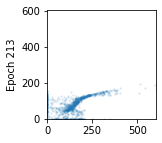

Reconstruction:


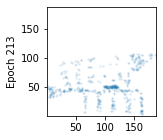

Epoch 214 elbo -6.689505


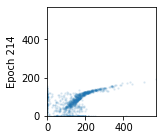

Reconstruction:


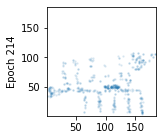

Epoch 215 elbo -6.4258633


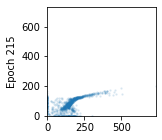

Reconstruction:


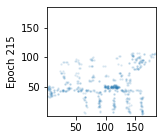

Epoch 216 elbo -6.61261


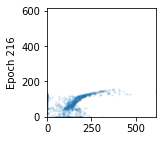

Reconstruction:


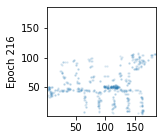

Epoch 217 elbo -8.549209


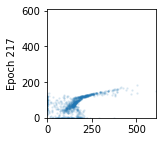

Reconstruction:


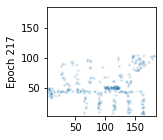

Epoch 218 elbo -6.915501


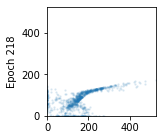

Reconstruction:


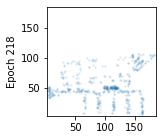

Epoch 219 elbo -7.001937


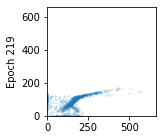

Reconstruction:


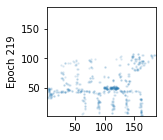

Epoch 220 elbo -6.951522


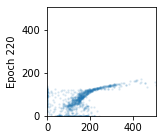

Reconstruction:


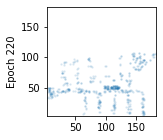

Epoch 221 elbo -6.9527645


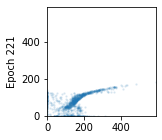

Reconstruction:


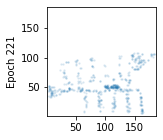

Epoch 222 elbo -6.63329


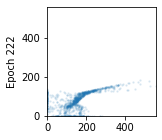

Reconstruction:


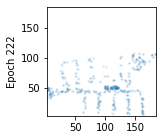

Epoch 223 elbo -6.465172


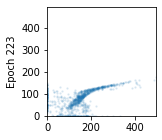

Reconstruction:


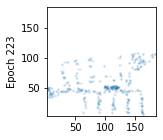

Epoch 224 elbo -6.457928


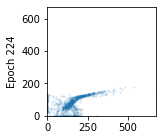

Reconstruction:


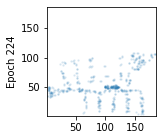

Epoch 225 elbo -8.90744


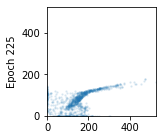

Reconstruction:


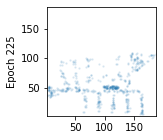

Epoch 226 elbo -6.466766


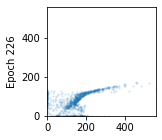

Reconstruction:


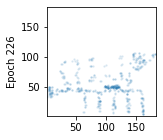

Epoch 227 elbo -7.681053


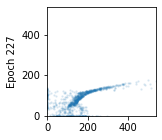

Reconstruction:


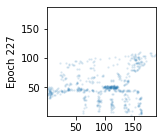

Epoch 228 elbo -7.924182


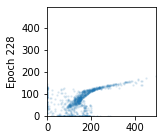

Reconstruction:


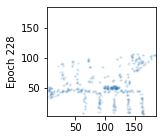

Epoch 229 elbo -7.0395184


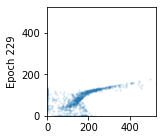

Reconstruction:


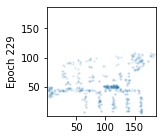

Epoch 230 elbo -6.5818415


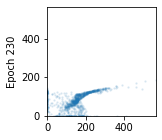

Reconstruction:


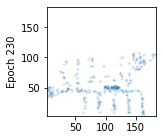

Epoch 231 elbo -8.892324


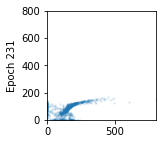

Reconstruction:


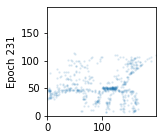

Epoch 232 elbo -6.3811984


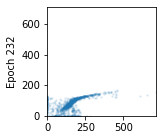

Reconstruction:


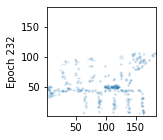

Epoch 233 elbo -7.8162923


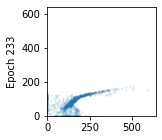

Reconstruction:


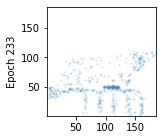

Epoch 234 elbo -6.46342


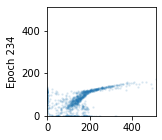

Reconstruction:


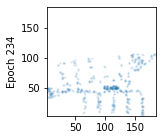

Epoch 235 elbo -6.4246273


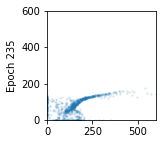

Reconstruction:


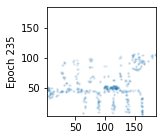

Epoch 236 elbo -6.4225693


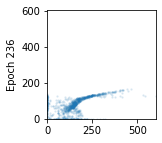

Reconstruction:


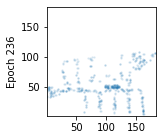

Epoch 237 elbo -6.837773


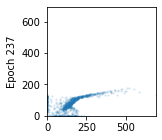

Reconstruction:


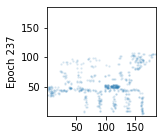

Epoch 238 elbo -8.036515


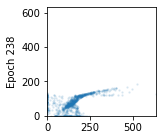

Reconstruction:


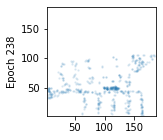

Epoch 239 elbo -6.717391


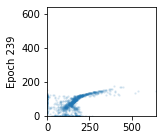

Reconstruction:


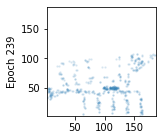

Epoch 240 elbo -6.548287


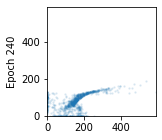

Reconstruction:


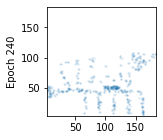

Epoch 241 elbo -6.6899257


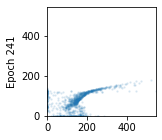

Reconstruction:


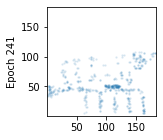

Epoch 242 elbo -7.8087583


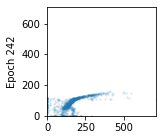

Reconstruction:


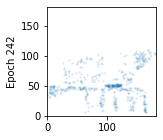

Epoch 243 elbo -6.9902987


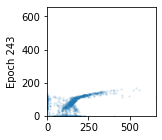

Reconstruction:


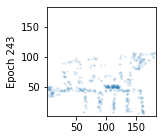

Epoch 244 elbo -6.481704


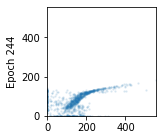

Reconstruction:


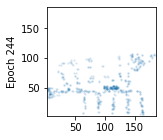

Epoch 245 elbo -7.369661


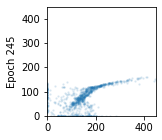

Reconstruction:


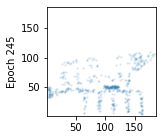

Epoch 246 elbo -6.551028


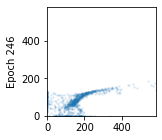

Reconstruction:


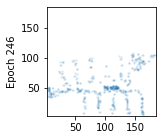

Epoch 247 elbo -6.640504


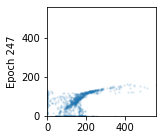

Reconstruction:


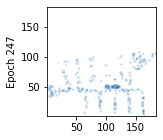

Epoch 248 elbo -7.6124415


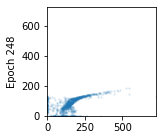

Reconstruction:


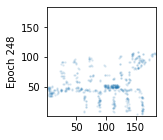

Epoch 249 elbo -7.456403


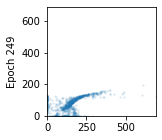

Reconstruction:


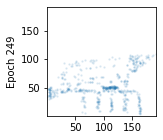

Epoch 250 elbo -7.913875


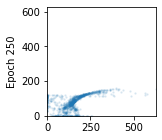

Reconstruction:


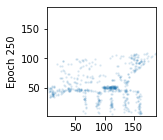

Epoch 251 elbo -8.421878


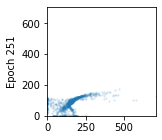

Reconstruction:


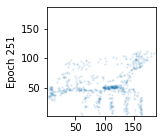

Epoch 252 elbo -7.6305013


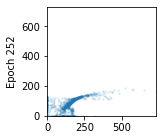

Reconstruction:


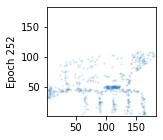

Epoch 253 elbo -7.9670825


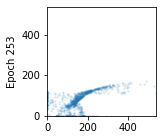

Reconstruction:


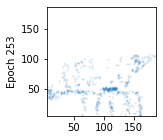

Epoch 254 elbo -6.6442056


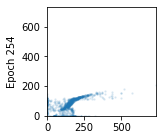

Reconstruction:


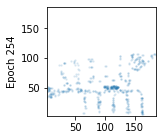

Epoch 255 elbo -8.051273


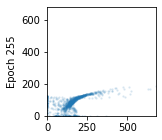

Reconstruction:


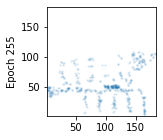

Epoch 256 elbo -6.4222827


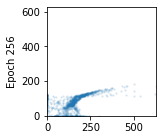

Reconstruction:


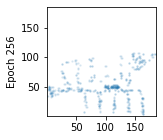

Epoch 257 elbo -6.8288093


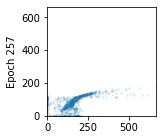

Reconstruction:


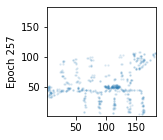

Epoch 258 elbo -7.514387


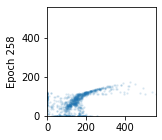

Reconstruction:


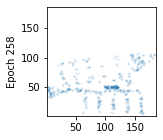

Epoch 259 elbo -6.5033603


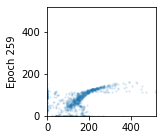

Reconstruction:


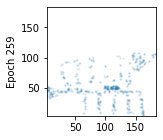

Epoch 260 elbo -6.636525


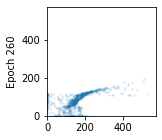

Reconstruction:


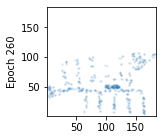

Epoch 261 elbo -6.6960945


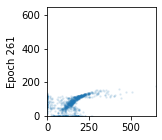

Reconstruction:


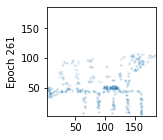

Epoch 262 elbo -6.952108


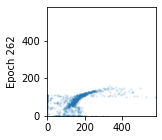

Reconstruction:


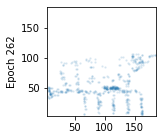

Epoch 263 elbo -7.3917613


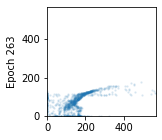

Reconstruction:


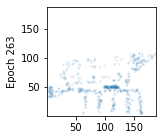

Epoch 264 elbo -6.816444


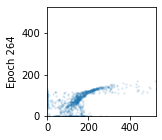

Reconstruction:


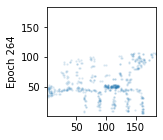

Epoch 265 elbo -6.713576


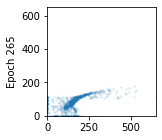

Reconstruction:


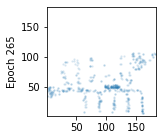

Epoch 266 elbo -6.8627605


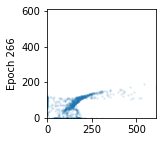

Reconstruction:


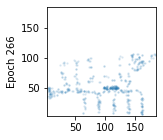

Epoch 267 elbo -6.8159714


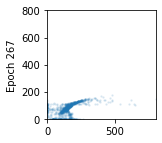

Reconstruction:


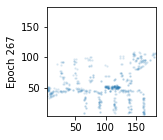

Epoch 268 elbo -6.811934


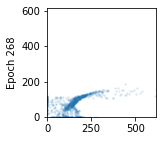

Reconstruction:


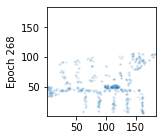

Epoch 269 elbo -6.561662


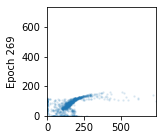

Reconstruction:


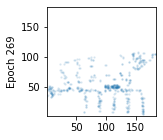

Epoch 270 elbo -6.652109


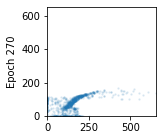

Reconstruction:


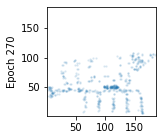

Epoch 271 elbo -6.5789437


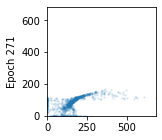

Reconstruction:


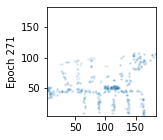

Epoch 272 elbo -7.312811


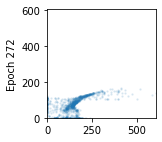

Reconstruction:


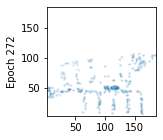

Epoch 273 elbo -6.605354


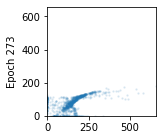

Reconstruction:


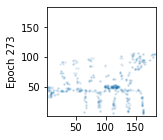

Epoch 274 elbo -9.446123


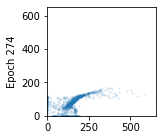

Reconstruction:


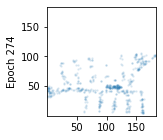

Epoch 275 elbo -6.804127


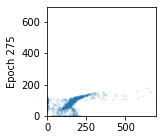

Reconstruction:


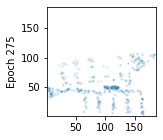

Epoch 276 elbo -6.688633


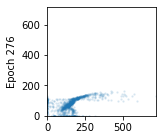

Reconstruction:


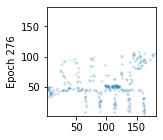

Epoch 277 elbo -7.6521063


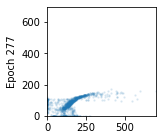

Reconstruction:


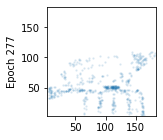

Epoch 278 elbo -6.731505


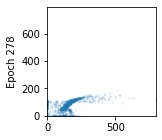

Reconstruction:


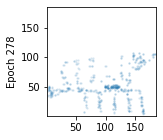

Epoch 279 elbo -6.504823


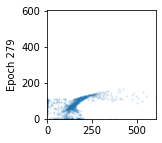

Reconstruction:


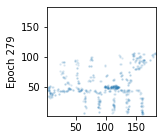

Epoch 280 elbo -7.914058


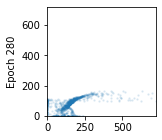

Reconstruction:


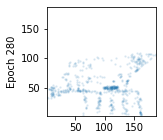

Epoch 281 elbo -6.316594


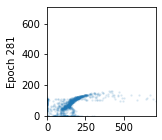

Reconstruction:


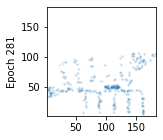

Epoch 282 elbo -6.6962957


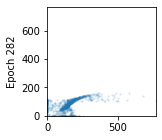

Reconstruction:


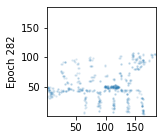

Epoch 283 elbo -6.917195


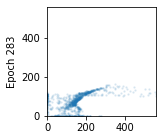

Reconstruction:


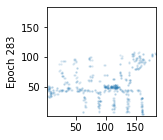

Epoch 284 elbo -6.8457737


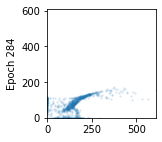

Reconstruction:


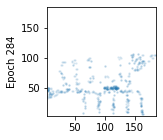

Epoch 285 elbo -7.898257


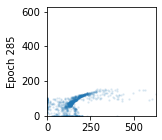

Reconstruction:


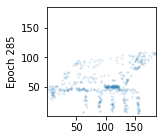

Epoch 286 elbo -6.2739353


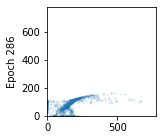

Reconstruction:


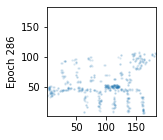

Epoch 287 elbo -8.960975


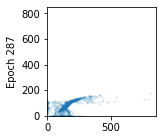

Reconstruction:


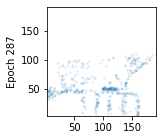

Epoch 288 elbo -6.2894077


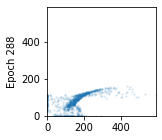

Reconstruction:


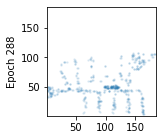

Epoch 289 elbo -7.032391


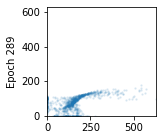

Reconstruction:


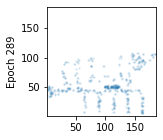

Epoch 290 elbo -8.550348


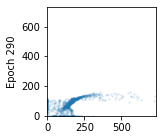

Reconstruction:


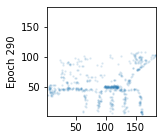

Epoch 291 elbo -6.8066254


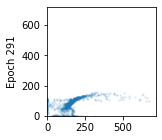

Reconstruction:


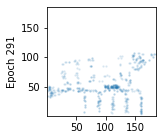

Epoch 292 elbo -6.4178457


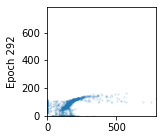

Reconstruction:


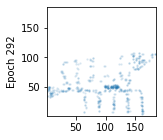

Epoch 293 elbo -7.5740104


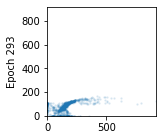

Reconstruction:


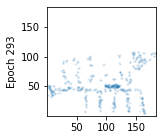

Epoch 294 elbo -7.209567


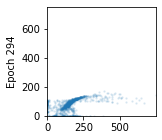

Reconstruction:


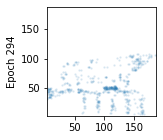

Epoch 295 elbo -6.6009717


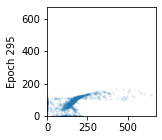

Reconstruction:


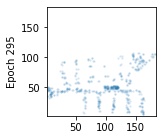

Epoch 296 elbo -6.5087476


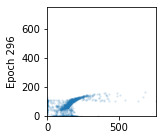

Reconstruction:


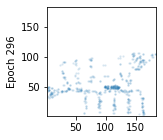

Epoch 297 elbo -6.437956


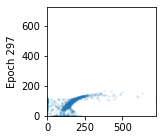

Reconstruction:


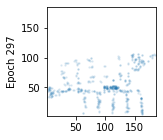

Epoch 298 elbo -7.8905525


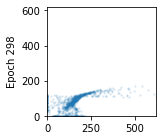

Reconstruction:


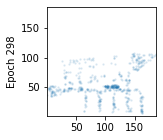

Epoch 299 elbo -8.440925


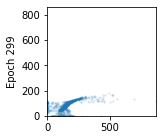

Reconstruction:


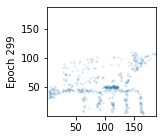

Epoch 300 elbo -6.8921695


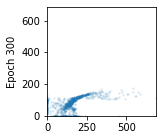

Reconstruction:


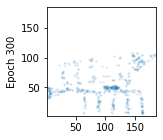

Epoch 301 elbo -6.4536977


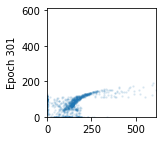

Reconstruction:


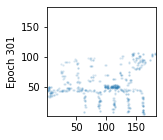

Epoch 302 elbo -6.7519145


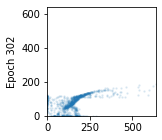

Reconstruction:


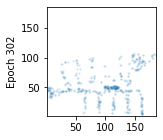

Epoch 303 elbo -8.071904


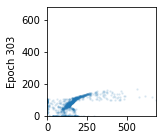

Reconstruction:


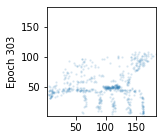

Epoch 304 elbo -6.607567


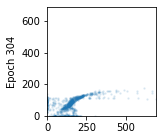

Reconstruction:


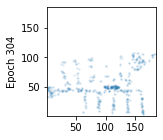

Epoch 305 elbo -6.4436107


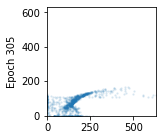

Reconstruction:


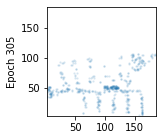

Epoch 306 elbo -7.3898363


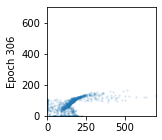

Reconstruction:


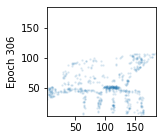

Epoch 307 elbo -6.590935


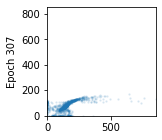

Reconstruction:


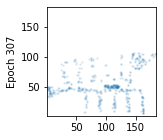

Epoch 308 elbo -6.980866


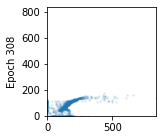

Reconstruction:


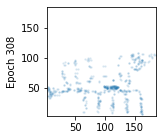

Epoch 309 elbo -6.7224727


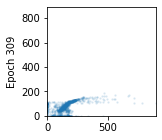

Reconstruction:


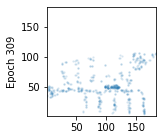

Epoch 310 elbo -6.4060526


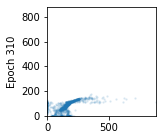

Reconstruction:


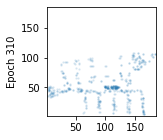

Epoch 311 elbo -6.7600136


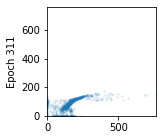

Reconstruction:


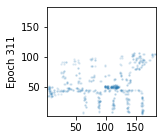

Epoch 312 elbo -6.977606


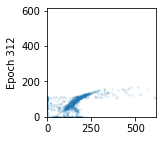

Reconstruction:


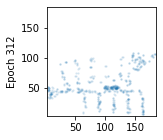

Epoch 313 elbo -6.940796


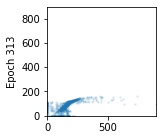

Reconstruction:


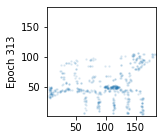

Epoch 314 elbo -6.7644067


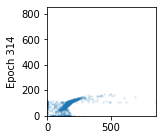

Reconstruction:


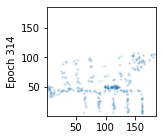

Epoch 315 elbo -6.9395304


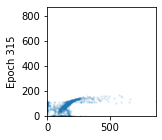

Reconstruction:


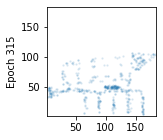

Epoch 316 elbo -7.6462746


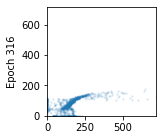

Reconstruction:


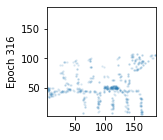

Epoch 317 elbo -6.3921704


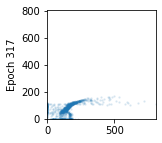

Reconstruction:


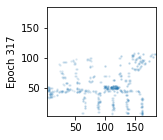

Epoch 318 elbo -6.6731696


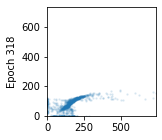

Reconstruction:


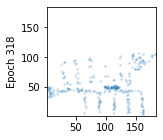

Epoch 319 elbo -6.305549


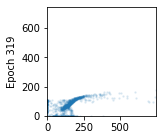

Reconstruction:


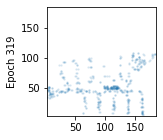

Epoch 320 elbo -7.3462663


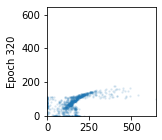

Reconstruction:


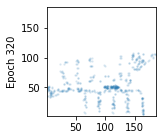

Epoch 321 elbo -6.5230784


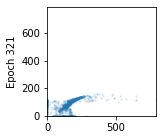

Reconstruction:


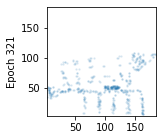

Epoch 322 elbo -6.779154


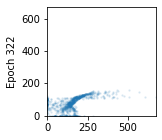

Reconstruction:


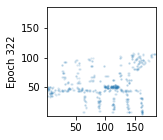

Epoch 323 elbo -6.762552


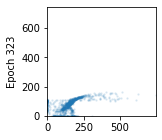

Reconstruction:


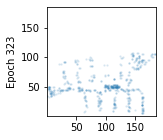

Epoch 324 elbo -7.012207


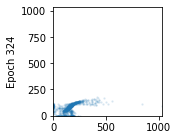

Reconstruction:


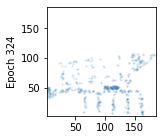

Epoch 325 elbo -6.8082275


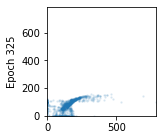

Reconstruction:


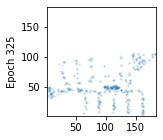

Epoch 326 elbo -9.991342


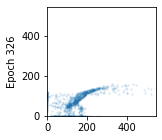

Reconstruction:


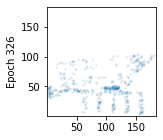

Epoch 327 elbo -6.508072


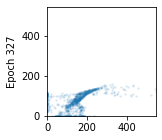

Reconstruction:


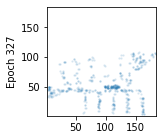

Epoch 328 elbo -6.949284


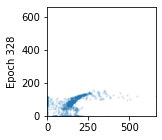

Reconstruction:


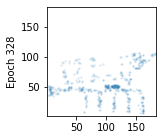

Epoch 329 elbo -6.4993386


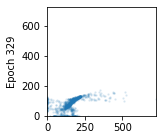

Reconstruction:


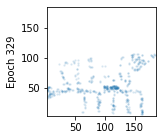

Epoch 330 elbo -6.3875427


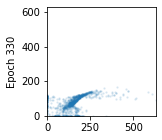

Reconstruction:


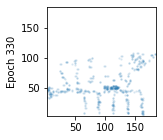

Epoch 331 elbo -6.5657


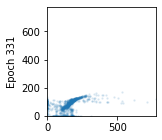

Reconstruction:


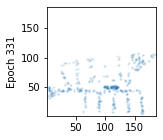

Epoch 332 elbo -6.6191587


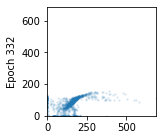

Reconstruction:


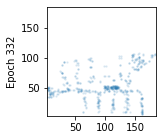

Epoch 333 elbo -7.0048842


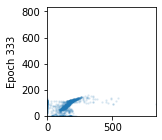

Reconstruction:


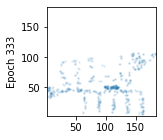

Epoch 334 elbo -6.419987


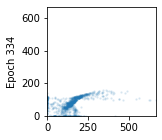

Reconstruction:


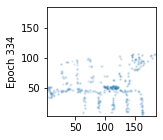

Epoch 335 elbo -6.833996


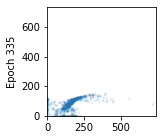

Reconstruction:


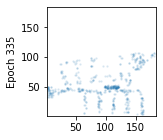

Epoch 336 elbo -7.2862363


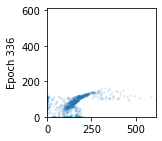

Reconstruction:


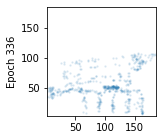

Epoch 337 elbo -6.401253


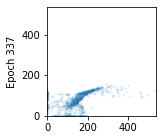

Reconstruction:


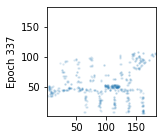

Epoch 338 elbo -6.666649


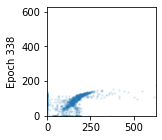

Reconstruction:


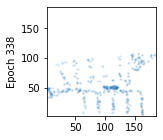

Epoch 339 elbo -6.5558043


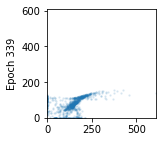

Reconstruction:


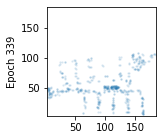

Epoch 340 elbo -7.4407115


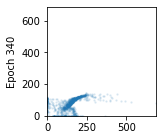

Reconstruction:


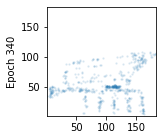

Epoch 341 elbo -6.509768


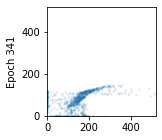

Reconstruction:


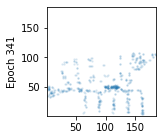

Epoch 342 elbo -6.7114754


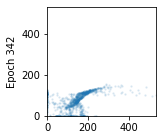

Reconstruction:


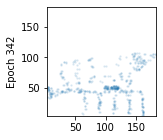

Epoch 343 elbo -6.355335


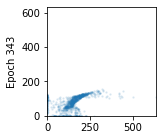

Reconstruction:


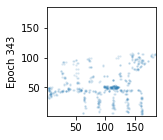

Epoch 344 elbo -8.06271


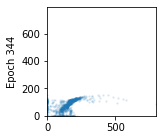

Reconstruction:


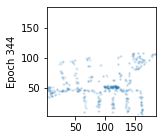

Epoch 345 elbo -8.141576


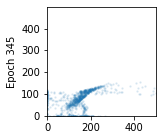

Reconstruction:


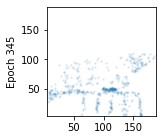

Epoch 346 elbo -8.5524025


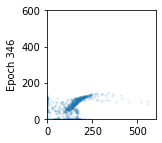

Reconstruction:


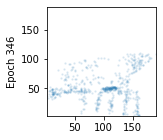

Epoch 347 elbo -6.928807


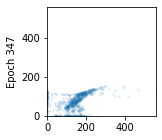

Reconstruction:


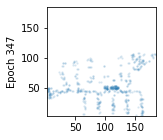

Epoch 348 elbo -7.3961377


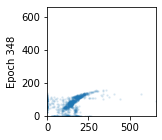

Reconstruction:


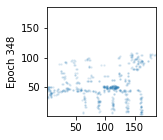

Epoch 349 elbo -6.6632247


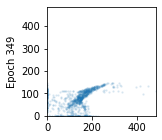

Reconstruction:


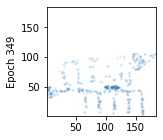

Epoch 350 elbo -7.857474


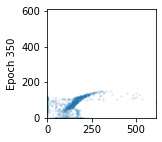

Reconstruction:


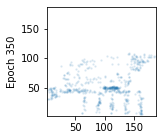

Epoch 351 elbo -6.8250723


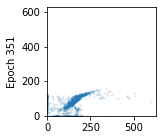

Reconstruction:


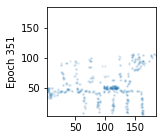

Epoch 352 elbo -7.6003776


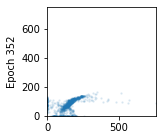

Reconstruction:


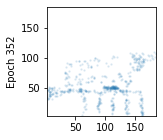

Epoch 353 elbo -6.6082335


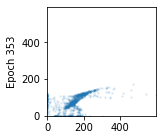

Reconstruction:


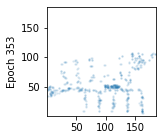

Epoch 354 elbo -7.0071206


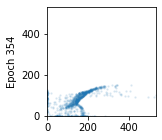

Reconstruction:


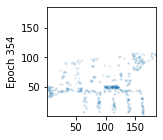

Epoch 355 elbo -6.795154


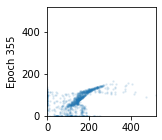

Reconstruction:


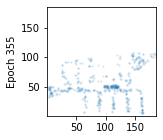

Epoch 356 elbo -6.6559644


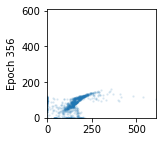

Reconstruction:


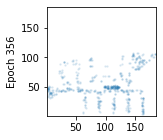

Epoch 357 elbo -7.457203


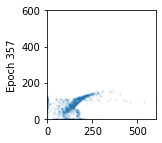

Reconstruction:


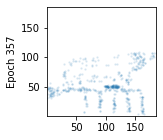

Epoch 358 elbo -9.291919


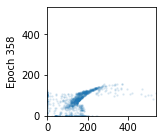

Reconstruction:


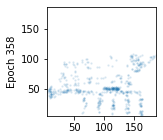

Epoch 359 elbo -9.12158


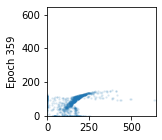

Reconstruction:


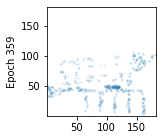

Epoch 360 elbo -6.472595


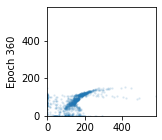

Reconstruction:


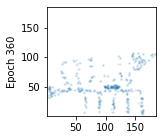

Epoch 361 elbo -7.9922266


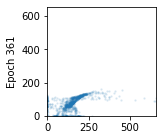

Reconstruction:


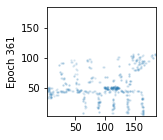

Epoch 362 elbo -7.8869534


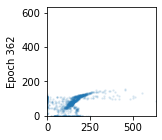

Reconstruction:


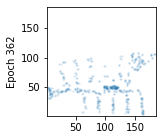

Epoch 363 elbo -8.842044


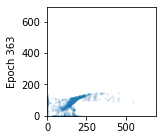

Reconstruction:


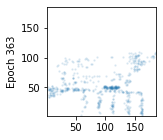

Epoch 364 elbo -7.2640657


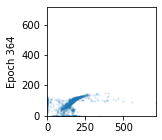

Reconstruction:


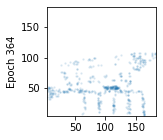

Epoch 365 elbo -6.266599


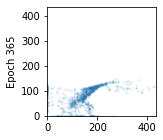

Reconstruction:


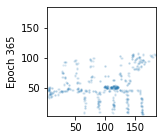

Epoch 366 elbo -6.5594006


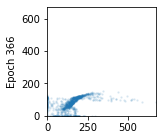

Reconstruction:


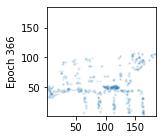

Epoch 367 elbo -6.7767444


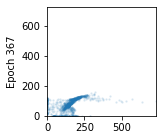

Reconstruction:


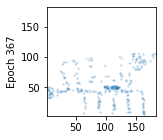

Epoch 368 elbo -6.5482974


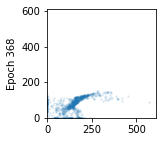

Reconstruction:


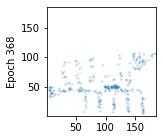

Epoch 369 elbo -6.534805


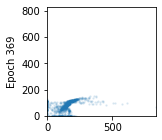

Reconstruction:


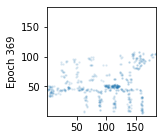

Epoch 370 elbo -7.689582


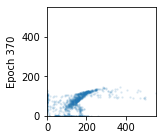

Reconstruction:


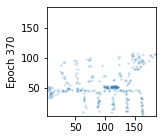

Epoch 371 elbo -6.731604


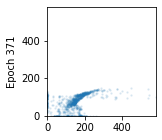

Reconstruction:


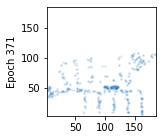

Epoch 372 elbo -8.431629


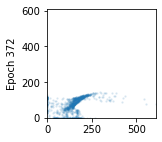

Reconstruction:


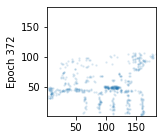

Epoch 373 elbo -6.1748176


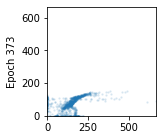

Reconstruction:


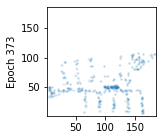

Epoch 374 elbo -6.3811264


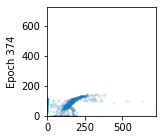

Reconstruction:


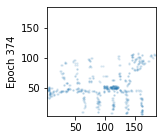

Epoch 375 elbo -6.4071035


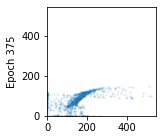

Reconstruction:


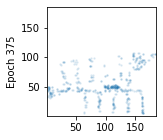

Epoch 376 elbo -6.9652195


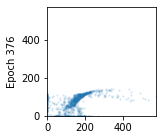

Reconstruction:


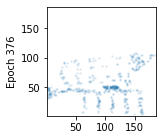

Epoch 377 elbo -6.9414406


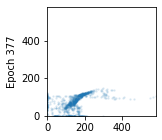

Reconstruction:


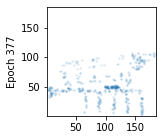

Epoch 378 elbo -7.6506715


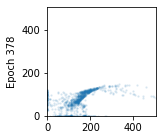

Reconstruction:


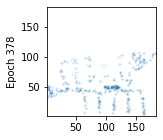

Epoch 379 elbo -6.564263


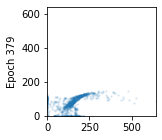

Reconstruction:


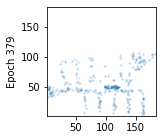

Epoch 380 elbo -6.36564


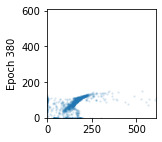

Reconstruction:


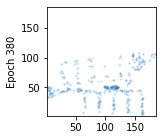

Epoch 381 elbo -6.863882


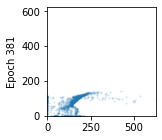

Reconstruction:


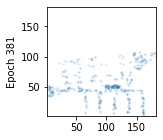

Epoch 382 elbo -6.5373836


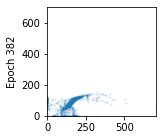

Reconstruction:


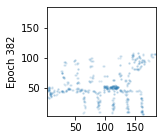

Epoch 383 elbo -6.3136787


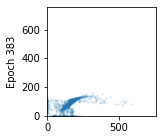

Reconstruction:


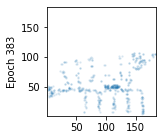

Epoch 384 elbo -6.241439


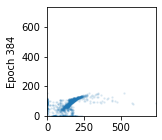

Reconstruction:


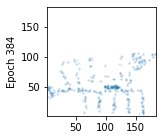

Epoch 385 elbo -8.193046


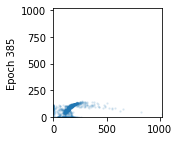

Reconstruction:


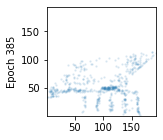

Epoch 386 elbo -6.5535264


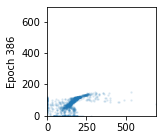

Reconstruction:


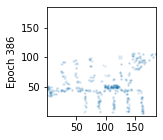

Epoch 387 elbo -7.249459


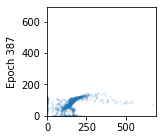

Reconstruction:


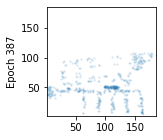

Epoch 388 elbo -6.727428


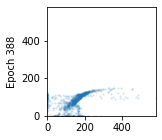

Reconstruction:


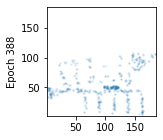

Epoch 389 elbo -6.771281


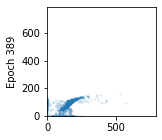

Reconstruction:


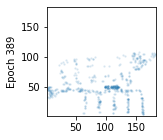

Epoch 390 elbo -6.3158665


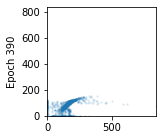

Reconstruction:


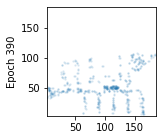

Epoch 391 elbo -6.369719


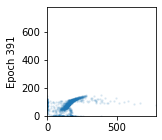

Reconstruction:


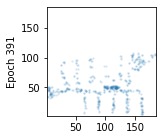

Epoch 392 elbo -6.549721


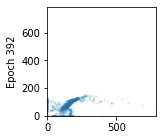

Reconstruction:


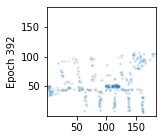

Epoch 393 elbo -6.5360456


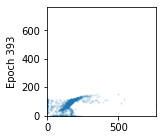

Reconstruction:


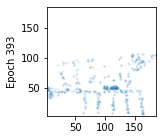

Epoch 394 elbo -6.646719


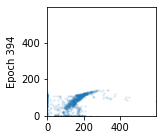

Reconstruction:


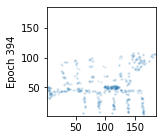

Epoch 395 elbo -6.5569477


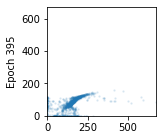

Reconstruction:


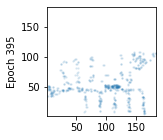

Epoch 396 elbo -6.866787


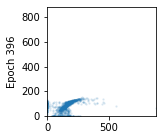

Reconstruction:


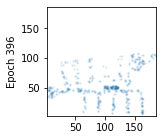

Epoch 397 elbo -6.4244924


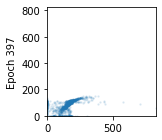

Reconstruction:


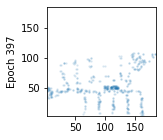

Epoch 398 elbo -6.3311424


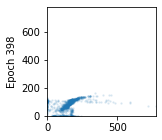

Reconstruction:


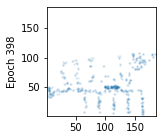

Epoch 399 elbo -6.555818


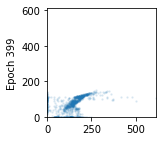

Reconstruction:


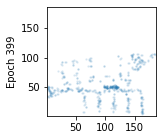

Epoch 400 elbo -6.3832135


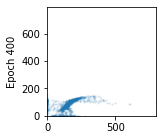

Reconstruction:


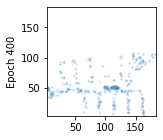

Epoch 401 elbo -7.458029


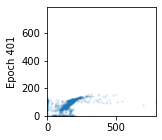

Reconstruction:


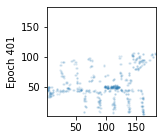

Epoch 402 elbo -7.0952907


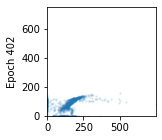

Reconstruction:


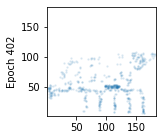

Epoch 403 elbo -6.3911757


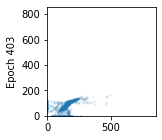

Reconstruction:


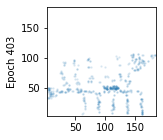

Epoch 404 elbo -6.9565706


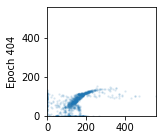

Reconstruction:


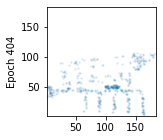

Epoch 405 elbo -6.289133


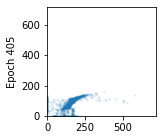

Reconstruction:


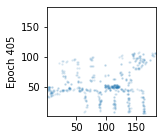

Epoch 406 elbo -8.164064


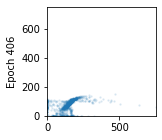

Reconstruction:


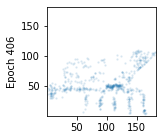

Epoch 407 elbo -8.780052


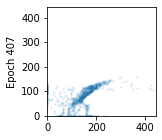

Reconstruction:


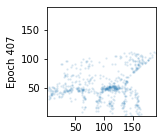

Epoch 408 elbo -6.3474965


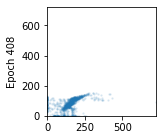

Reconstruction:


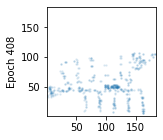

Epoch 409 elbo -6.6990757


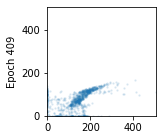

Reconstruction:


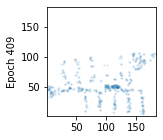

Epoch 410 elbo -6.4954176


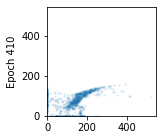

Reconstruction:


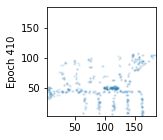

Epoch 411 elbo -6.4838843


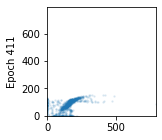

Reconstruction:


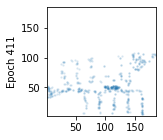

Epoch 412 elbo -7.1477294


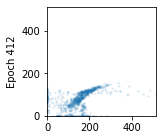

Reconstruction:


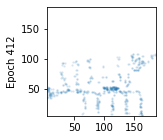

Epoch 413 elbo -7.934295


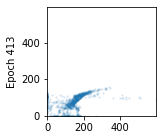

Reconstruction:


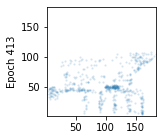

Epoch 414 elbo -6.902347


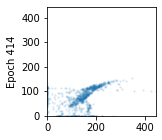

Reconstruction:


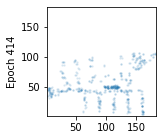

Epoch 415 elbo -6.4781413


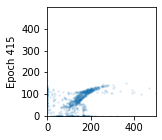

Reconstruction:


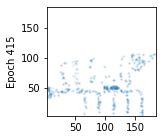

Epoch 416 elbo -7.4775796


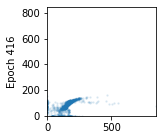

Reconstruction:


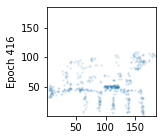

Epoch 417 elbo -7.118146


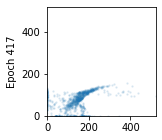

Reconstruction:


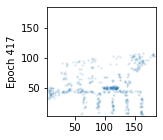

Epoch 418 elbo -7.3417335


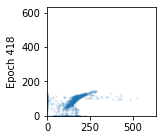

Reconstruction:


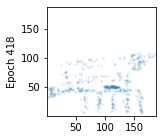

Epoch 419 elbo -6.674926


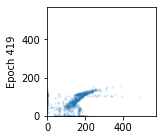

Reconstruction:


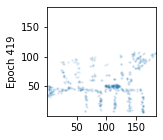

Epoch 420 elbo -7.740988


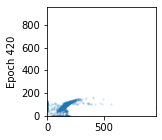

Reconstruction:


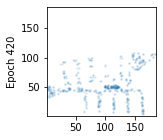

Epoch 421 elbo -6.517516


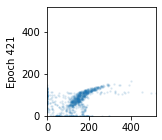

Reconstruction:


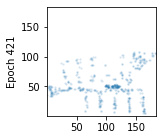

Epoch 422 elbo -6.91791


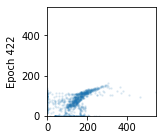

Reconstruction:


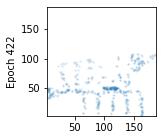

Epoch 423 elbo -6.9161816


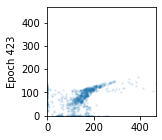

Reconstruction:


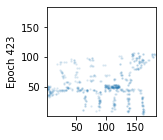

Epoch 424 elbo -8.409894


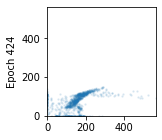

Reconstruction:


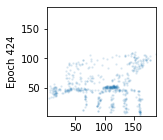

Epoch 425 elbo -6.647994


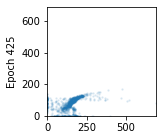

Reconstruction:


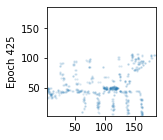

Epoch 426 elbo -6.4045315


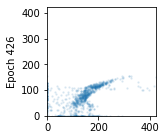

Reconstruction:


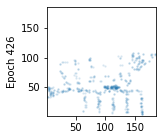

Epoch 427 elbo -9.112827


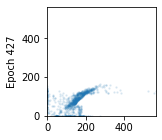

Reconstruction:


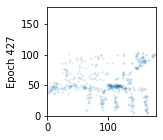

Epoch 428 elbo -7.696521


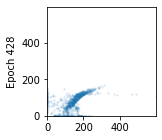

Reconstruction:


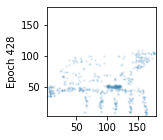

Epoch 429 elbo -6.612099


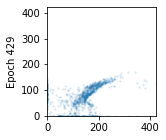

Reconstruction:


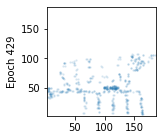

Epoch 430 elbo -6.725851


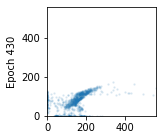

Reconstruction:


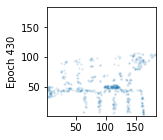

Epoch 431 elbo -6.4136915


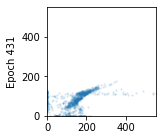

Reconstruction:


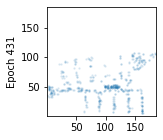

Epoch 432 elbo -6.6649127


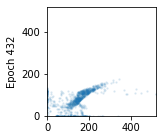

Reconstruction:


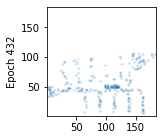

Epoch 433 elbo -7.1588364


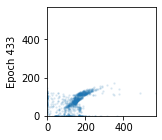

Reconstruction:


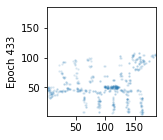

Epoch 434 elbo -6.3560333


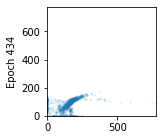

Reconstruction:


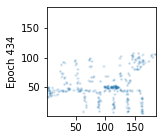

Epoch 435 elbo -6.4086065


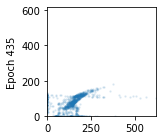

Reconstruction:


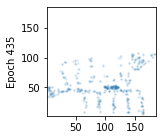

Epoch 436 elbo -6.5470057


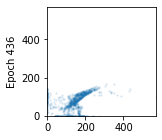

Reconstruction:


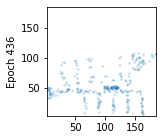

Epoch 437 elbo -7.07887


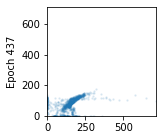

Reconstruction:


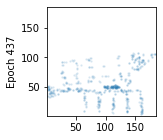

Epoch 438 elbo -6.490516


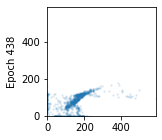

Reconstruction:


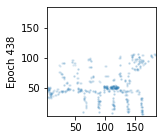

Epoch 439 elbo -7.43013


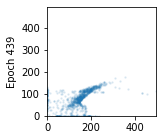

Reconstruction:


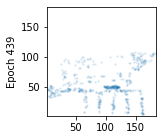

Epoch 440 elbo -7.7503386


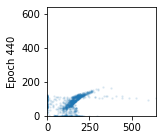

Reconstruction:


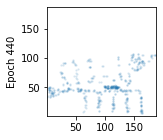

Epoch 441 elbo -7.2455845


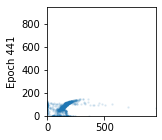

Reconstruction:


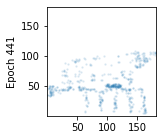

Epoch 442 elbo -6.868196


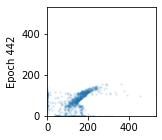

Reconstruction:


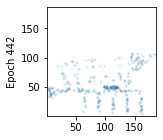

Epoch 443 elbo -6.5217695


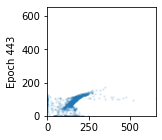

Reconstruction:


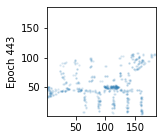

Epoch 444 elbo -6.4001694


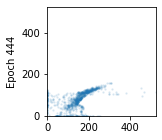

Reconstruction:


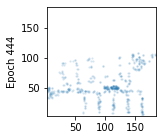

Epoch 445 elbo -8.317138


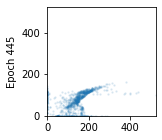

Reconstruction:


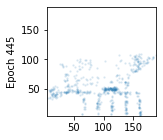

Epoch 446 elbo -6.799843


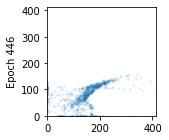

Reconstruction:


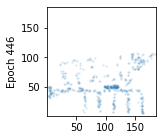

Epoch 447 elbo -7.506433


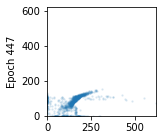

Reconstruction:


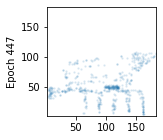

Epoch 448 elbo -7.6024714


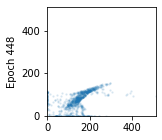

Reconstruction:


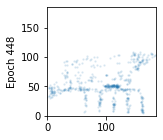

Epoch 449 elbo -6.3384495


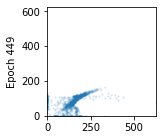

Reconstruction:


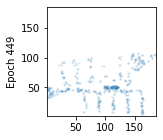

Epoch 450 elbo -6.398941


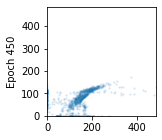

Reconstruction:


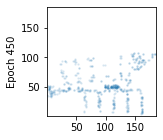

Epoch 451 elbo -7.538983


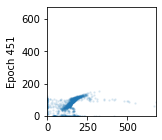

Reconstruction:


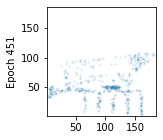

Epoch 452 elbo -6.510527


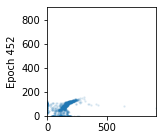

Reconstruction:


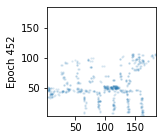

Epoch 453 elbo -6.355191


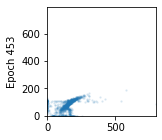

Reconstruction:


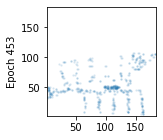

Epoch 454 elbo -6.673344


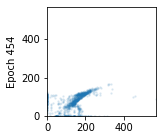

Reconstruction:


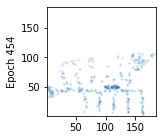

Epoch 455 elbo -6.825473


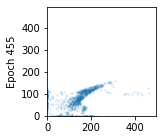

Reconstruction:


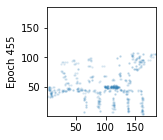

Epoch 456 elbo -6.9335732


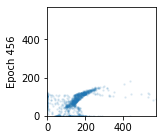

Reconstruction:


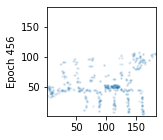

Epoch 457 elbo -7.9921694


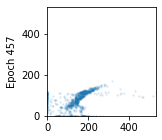

Reconstruction:


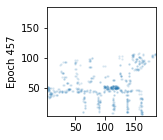

Epoch 458 elbo -6.5037355


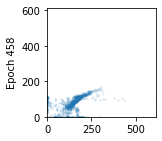

Reconstruction:


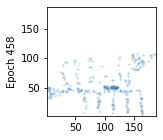

Epoch 459 elbo -7.080281


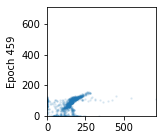

Reconstruction:


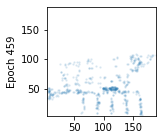

Epoch 460 elbo -6.853885


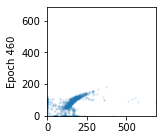

Reconstruction:


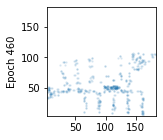

Epoch 461 elbo -6.5953445


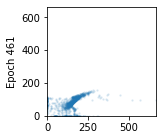

Reconstruction:


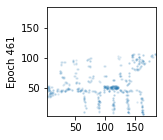

Epoch 462 elbo -6.5782967


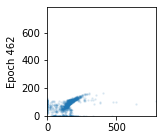

Reconstruction:


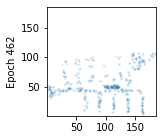

Epoch 463 elbo -7.58661


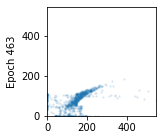

Reconstruction:


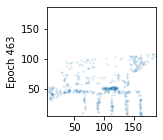

Epoch 464 elbo -6.73773


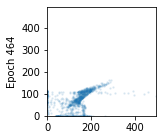

Reconstruction:


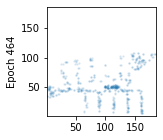

Epoch 465 elbo -6.4972825


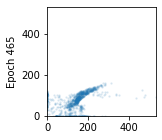

Reconstruction:


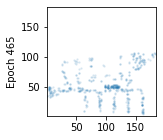

Epoch 466 elbo -6.3011823


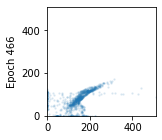

Reconstruction:


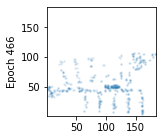

Epoch 467 elbo -6.491962


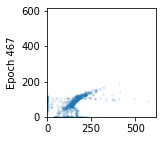

Reconstruction:


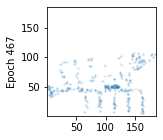

Epoch 468 elbo -6.1287518


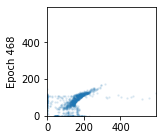

Reconstruction:


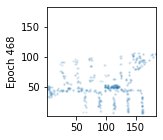

Epoch 469 elbo -6.6961775


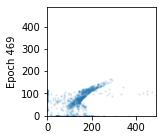

Reconstruction:


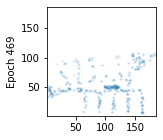

Epoch 470 elbo -7.368491


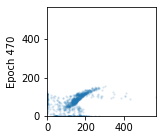

Reconstruction:


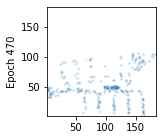

Epoch 471 elbo -7.062985


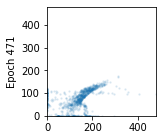

Reconstruction:


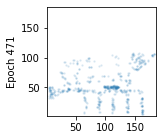

Epoch 472 elbo -7.476428


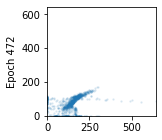

Reconstruction:


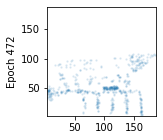

Epoch 473 elbo -7.519476


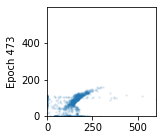

Reconstruction:


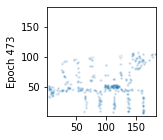

Epoch 474 elbo -6.3201084


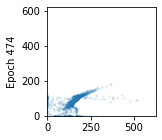

Reconstruction:


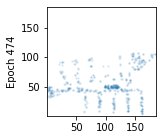

Epoch 475 elbo -7.833722


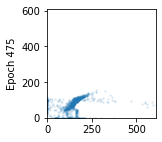

Reconstruction:


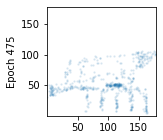

Epoch 476 elbo -6.8490415


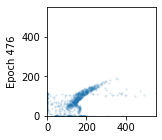

Reconstruction:


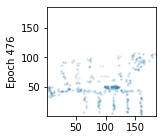

Epoch 477 elbo -6.4136963


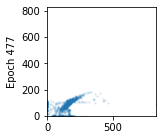

Reconstruction:


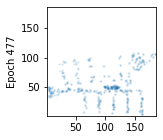

Epoch 478 elbo -6.8190365


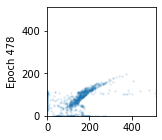

Reconstruction:


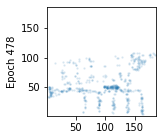

Epoch 479 elbo -6.446463


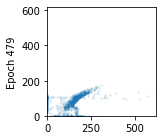

Reconstruction:


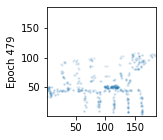

Epoch 480 elbo -6.5511813


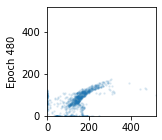

Reconstruction:


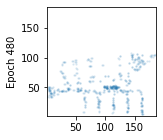

Epoch 481 elbo -6.7098207


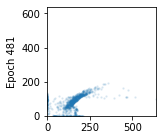

Reconstruction:


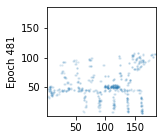

Epoch 482 elbo -7.446457


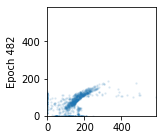

Reconstruction:


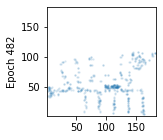

Epoch 483 elbo -7.90388


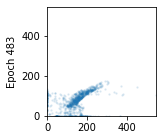

Reconstruction:


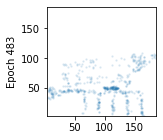

Epoch 484 elbo -6.360314


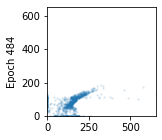

Reconstruction:


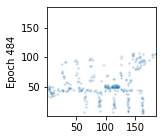

Epoch 485 elbo -6.8346133


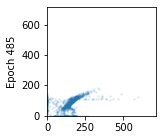

Reconstruction:


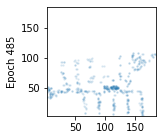

Epoch 486 elbo -6.8888063


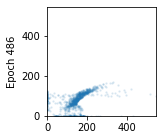

Reconstruction:


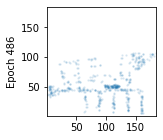

Epoch 487 elbo -6.8249836


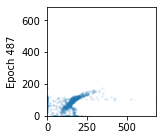

Reconstruction:


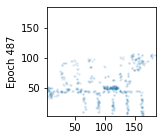

Epoch 488 elbo -6.4721932


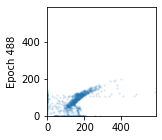

Reconstruction:


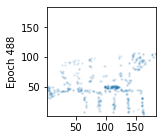

Epoch 489 elbo -6.726112


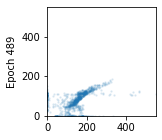

Reconstruction:


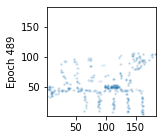

Epoch 490 elbo -8.326375


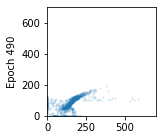

Reconstruction:


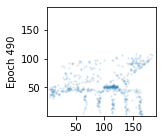

Epoch 491 elbo -6.483329


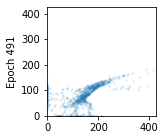

Reconstruction:


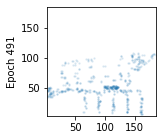

Epoch 492 elbo -7.3461027


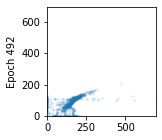

Reconstruction:


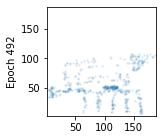

Epoch 493 elbo -6.3971295


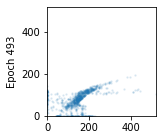

Reconstruction:


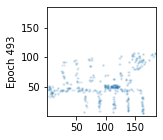

Epoch 494 elbo -6.4769406


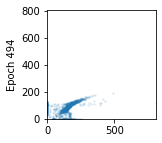

Reconstruction:


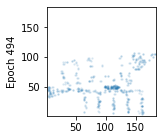

Epoch 495 elbo -7.356875


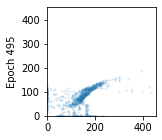

Reconstruction:


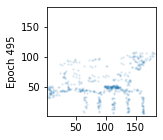

Epoch 496 elbo -6.532185


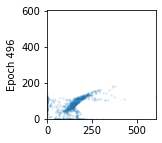

Reconstruction:


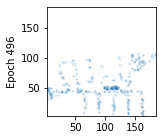

Epoch 497 elbo -6.3540754


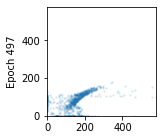

Reconstruction:


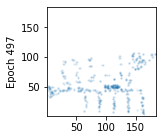

Epoch 498 elbo -6.4842467


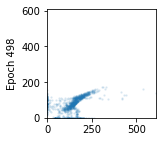

Reconstruction:


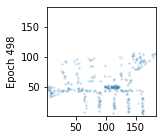

Epoch 499 elbo -6.541216


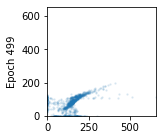

Reconstruction:


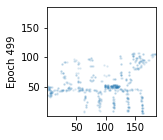

Epoch 500 elbo -6.333618


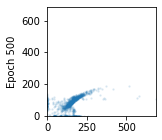

Reconstruction:


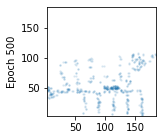

Epoch 501 elbo -8.452883


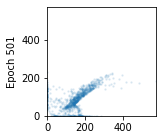

Reconstruction:


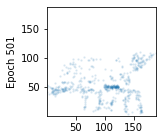

Epoch 502 elbo -7.512076


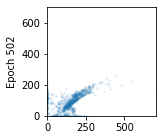

Reconstruction:


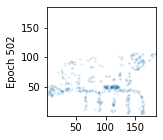

Epoch 503 elbo -7.242891


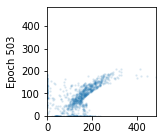

Reconstruction:


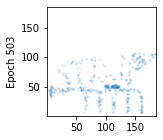

Epoch 504 elbo -7.164316


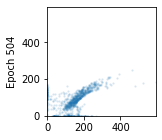

Reconstruction:


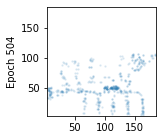

Epoch 505 elbo -6.9506364


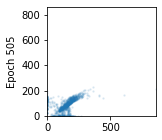

Reconstruction:


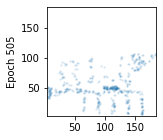

Epoch 506 elbo -7.6533074


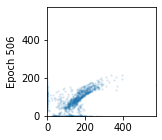

Reconstruction:


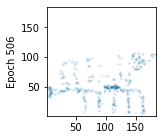

Epoch 507 elbo -8.243145


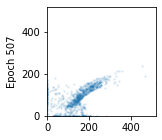

Reconstruction:


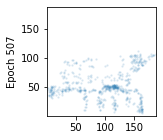

Epoch 508 elbo -6.7737346


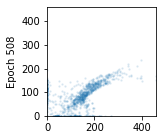

Reconstruction:


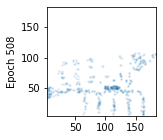

Epoch 509 elbo -6.8361864


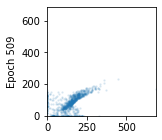

Reconstruction:


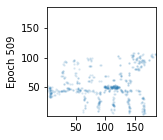

Epoch 510 elbo -7.084741


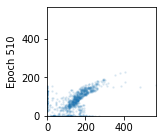

Reconstruction:


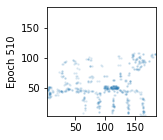

Epoch 511 elbo -7.5127797


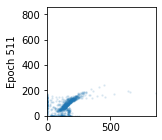

Reconstruction:


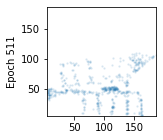

Epoch 512 elbo -7.257111


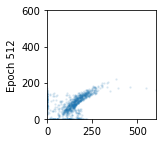

Reconstruction:


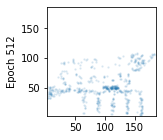

Epoch 513 elbo -6.8930793


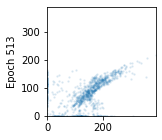

Reconstruction:


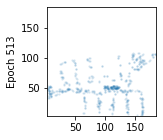

Epoch 514 elbo -8.824468


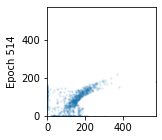

Reconstruction:


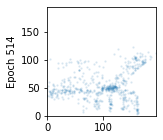

Epoch 515 elbo -6.6571956


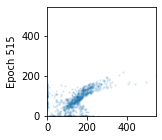

Reconstruction:


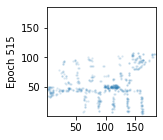

Epoch 516 elbo -7.1562467


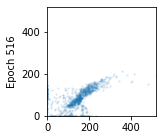

Reconstruction:


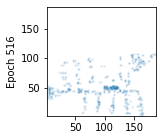

Epoch 517 elbo -7.326398


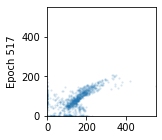

Reconstruction:


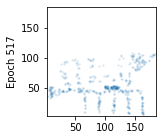

Epoch 518 elbo -6.7891054


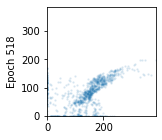

Reconstruction:


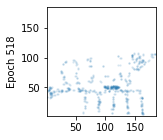

Epoch 519 elbo -6.809494


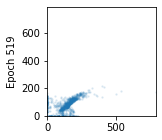

Reconstruction:


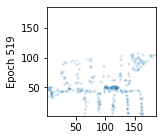

Epoch 520 elbo -8.749346


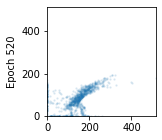

Reconstruction:


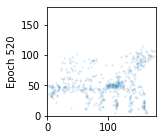

Epoch 521 elbo -7.1887355


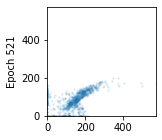

Reconstruction:


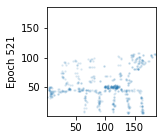

Epoch 522 elbo -8.733844


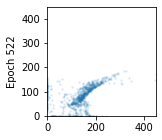

Reconstruction:


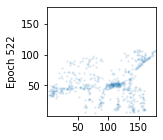

Epoch 523 elbo -7.382671


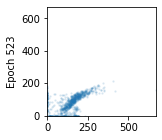

Reconstruction:


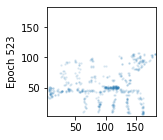

Epoch 524 elbo -8.51373


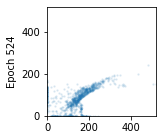

Reconstruction:


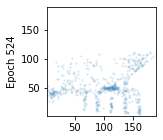

Epoch 525 elbo -7.0037


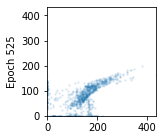

Reconstruction:


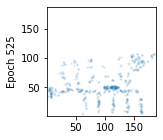

Epoch 526 elbo -7.053847


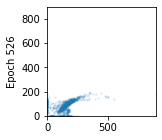

Reconstruction:


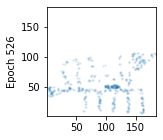

Epoch 527 elbo -6.9727187


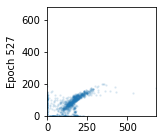

Reconstruction:


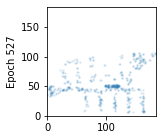

Epoch 528 elbo -11.078424


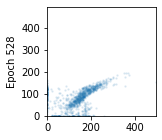

Reconstruction:


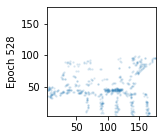

Epoch 529 elbo -7.2101936


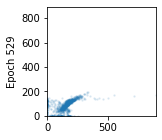

Reconstruction:


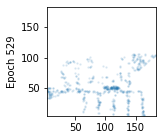

Epoch 530 elbo -7.886472


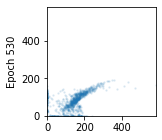

Reconstruction:


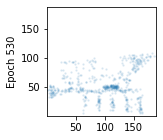

Epoch 531 elbo -6.694573


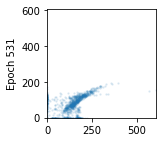

Reconstruction:


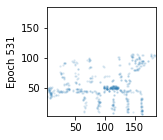

Epoch 532 elbo -6.973125


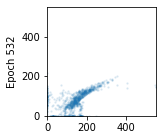

Reconstruction:


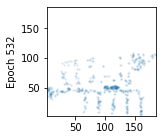

Epoch 533 elbo -6.967772


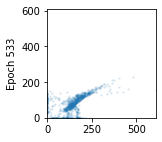

Reconstruction:


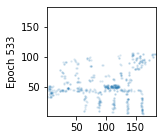

Epoch 534 elbo -7.718688


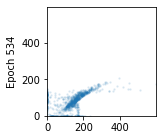

Reconstruction:


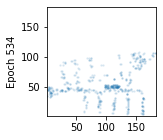

Epoch 535 elbo -7.000874


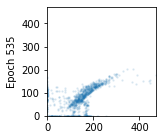

Reconstruction:


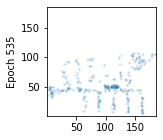

Epoch 536 elbo -7.272469


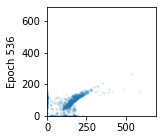

Reconstruction:


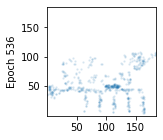

Epoch 537 elbo -6.9815364


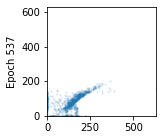

Reconstruction:


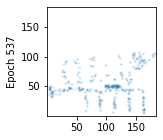

Epoch 538 elbo -6.84889


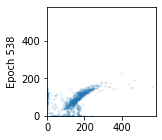

Reconstruction:


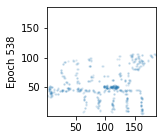

Epoch 539 elbo -6.52283


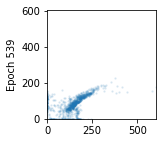

Reconstruction:


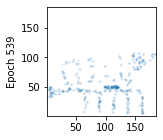

Epoch 540 elbo -6.695048


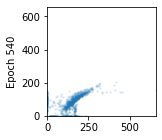

Reconstruction:


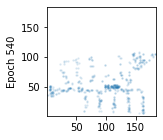

Epoch 541 elbo -7.3280044


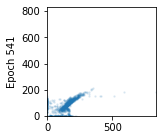

Reconstruction:


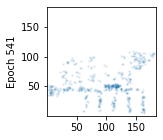

Epoch 542 elbo -6.624058


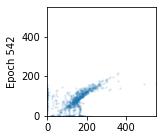

Reconstruction:


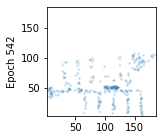

Epoch 543 elbo -7.047719


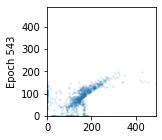

Reconstruction:


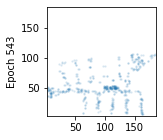

Epoch 544 elbo -7.240708


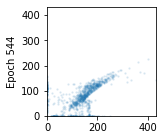

Reconstruction:


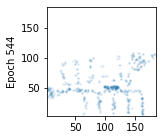

Epoch 545 elbo -6.896525


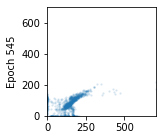

Reconstruction:


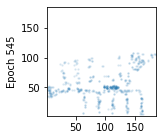

Epoch 546 elbo -7.454949


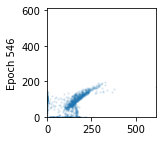

Reconstruction:


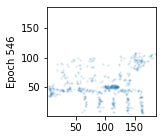

Epoch 547 elbo -6.910838


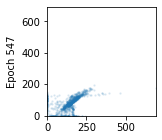

Reconstruction:


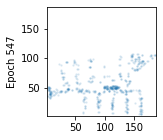

Epoch 548 elbo -7.515457


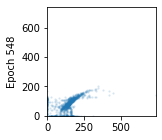

Reconstruction:


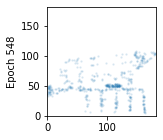

Epoch 549 elbo -6.9618015


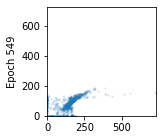

Reconstruction:


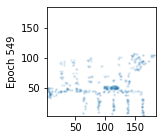

Epoch 550 elbo -9.087738


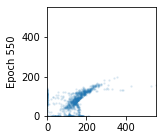

Reconstruction:


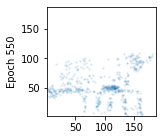

Epoch 551 elbo -7.4786897


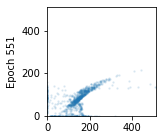

Reconstruction:


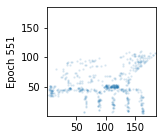

Epoch 552 elbo -6.924843


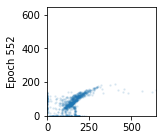

Reconstruction:


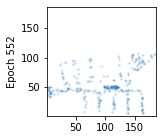

Epoch 553 elbo -8.666013


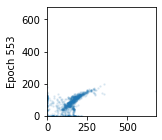

Reconstruction:


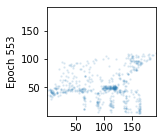

Epoch 554 elbo -7.2602253


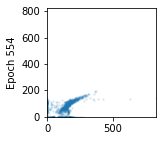

Reconstruction:


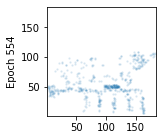

Epoch 555 elbo -9.144217


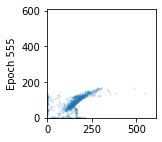

Reconstruction:


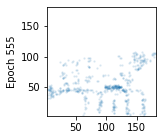

Epoch 556 elbo -6.8771076


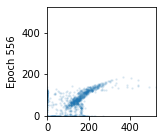

Reconstruction:


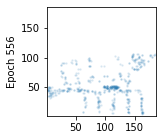

Epoch 557 elbo -8.226


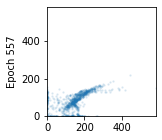

Reconstruction:


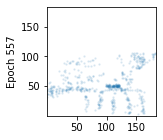

Epoch 558 elbo -6.7033415


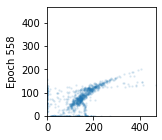

Reconstruction:


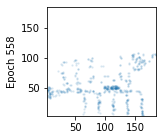

Epoch 559 elbo -6.572515


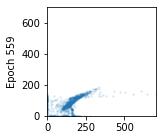

Reconstruction:


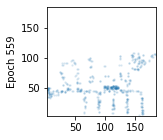

Epoch 560 elbo -6.967202


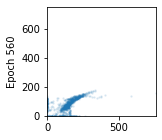

Reconstruction:


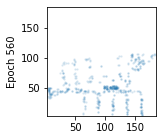

Epoch 561 elbo -7.012389


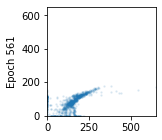

Reconstruction:


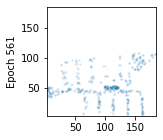

Epoch 562 elbo -6.699413


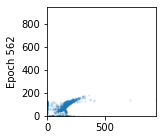

Reconstruction:


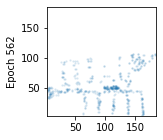

Epoch 563 elbo -6.7039943


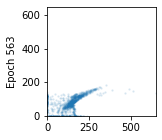

Reconstruction:


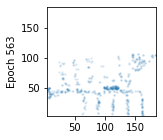

Epoch 564 elbo -6.8655796


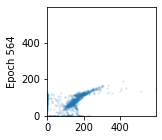

Reconstruction:


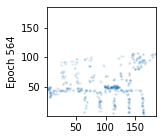

Epoch 565 elbo -6.598319


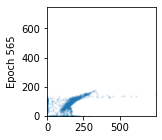

Reconstruction:


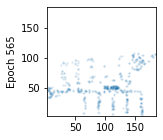

Epoch 566 elbo -8.5955305


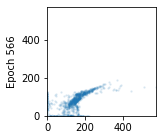

Reconstruction:


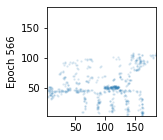

Epoch 567 elbo -8.97578


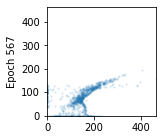

Reconstruction:


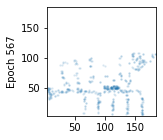

Epoch 568 elbo -7.0293236


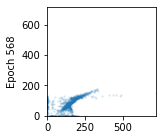

Reconstruction:


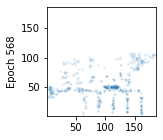

Epoch 569 elbo -6.5645375


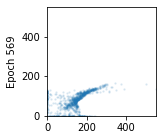

Reconstruction:


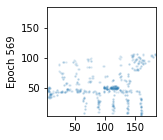

Epoch 570 elbo -6.470823


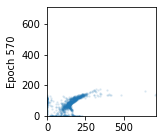

Reconstruction:


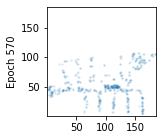

Epoch 571 elbo -6.6883945


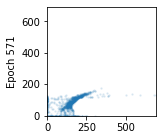

Reconstruction:


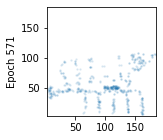

Epoch 572 elbo -9.265366


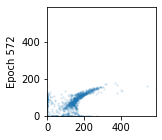

Reconstruction:


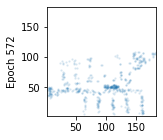

Epoch 573 elbo -6.649098


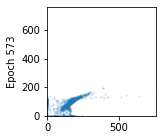

Reconstruction:


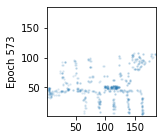

Epoch 574 elbo -6.6502643


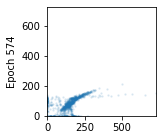

Reconstruction:


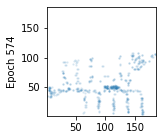

Epoch 575 elbo -6.622282


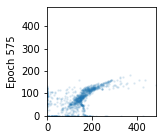

Reconstruction:


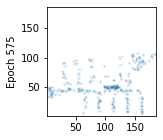

Epoch 576 elbo -6.557988


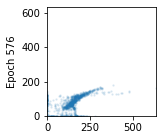

Reconstruction:


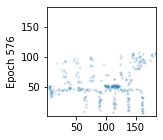

Epoch 577 elbo -6.9461327


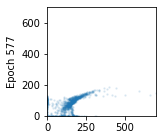

Reconstruction:


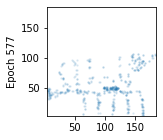

Epoch 578 elbo -8.074655


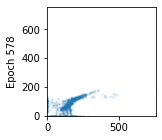

Reconstruction:


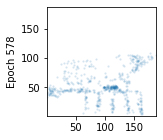

Epoch 579 elbo -6.440744


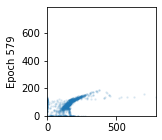

Reconstruction:


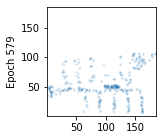

Epoch 580 elbo -6.511059


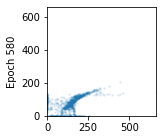

Reconstruction:


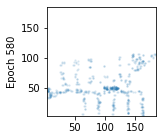

Epoch 581 elbo -6.3132153


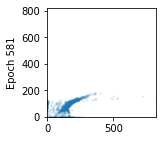

Reconstruction:


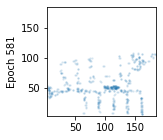

Epoch 582 elbo -8.255094


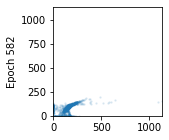

Reconstruction:


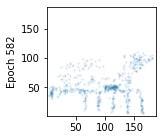

Epoch 583 elbo -6.6918316


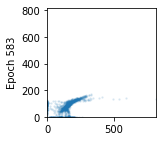

Reconstruction:


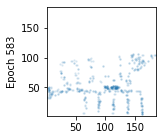

Epoch 584 elbo -6.348747


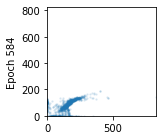

Reconstruction:


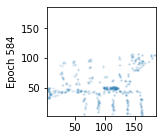

Epoch 585 elbo -6.5916147


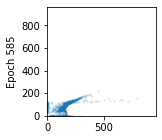

Reconstruction:


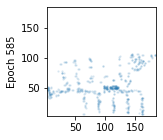

Epoch 586 elbo -7.283917


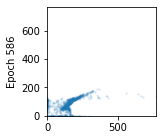

Reconstruction:


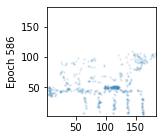

Epoch 587 elbo -7.1805305


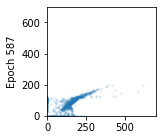

Reconstruction:


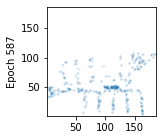

Epoch 588 elbo -6.3435645


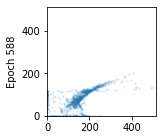

Reconstruction:


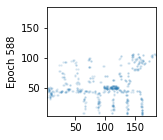

Epoch 589 elbo -6.7694573


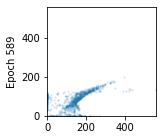

Reconstruction:


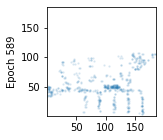

Epoch 590 elbo -8.002269


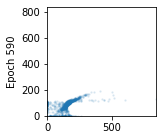

Reconstruction:


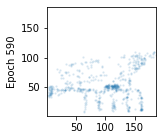

Epoch 591 elbo -6.633233


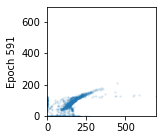

Reconstruction:


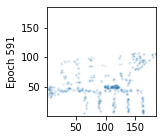

Epoch 592 elbo -8.046845


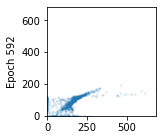

Reconstruction:


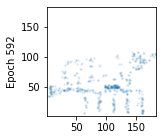

Epoch 593 elbo -6.5177627


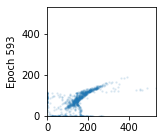

Reconstruction:


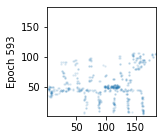

Epoch 594 elbo -6.5870914


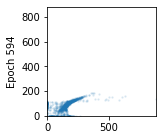

Reconstruction:


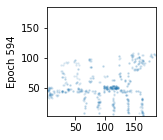

Epoch 595 elbo -6.401039


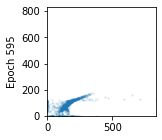

Reconstruction:


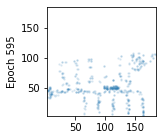

Epoch 596 elbo -8.176678


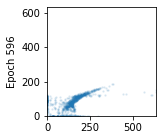

Reconstruction:


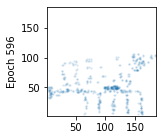

Epoch 597 elbo -6.8669386


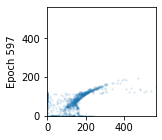

Reconstruction:


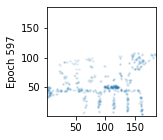

Epoch 598 elbo -6.4877877


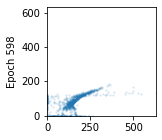

Reconstruction:


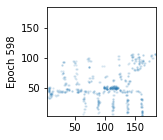

Epoch 599 elbo -7.731718


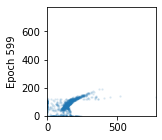

Reconstruction:


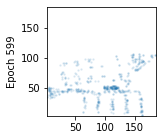

Epoch 600 elbo -7.014773


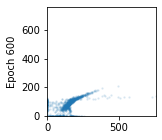

Reconstruction:


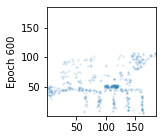

Epoch 601 elbo -7.0442157


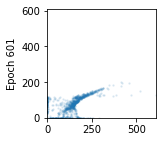

Reconstruction:


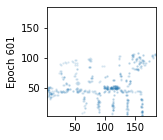

Epoch 602 elbo -6.469611


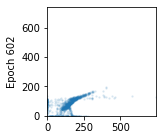

Reconstruction:


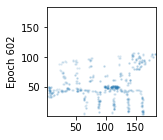

Epoch 603 elbo -8.774568


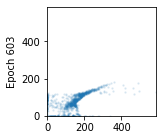

Reconstruction:


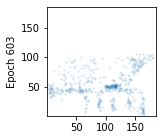

Epoch 604 elbo -6.367658


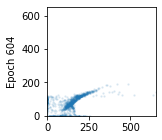

Reconstruction:


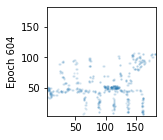

Epoch 605 elbo -6.513408


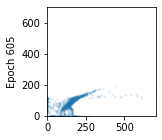

Reconstruction:


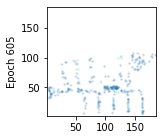

Epoch 606 elbo -6.476564


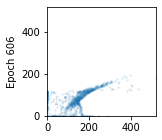

Reconstruction:


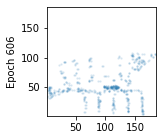

Epoch 607 elbo -6.516483


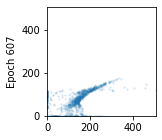

Reconstruction:


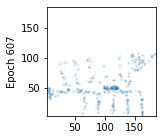

Epoch 608 elbo -7.597588


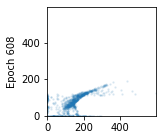

Reconstruction:


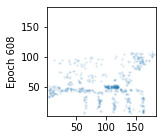

Epoch 609 elbo -8.103943


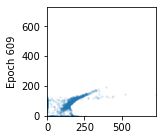

Reconstruction:


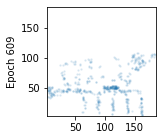

Epoch 610 elbo -6.609733


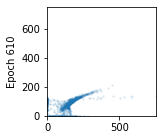

Reconstruction:


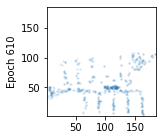

Epoch 611 elbo -6.644352


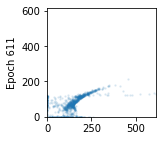

Reconstruction:


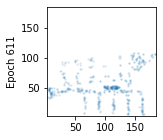

Epoch 612 elbo -7.869705


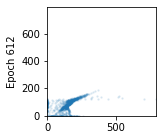

Reconstruction:


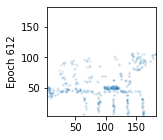

Epoch 613 elbo -6.636813


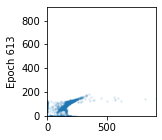

Reconstruction:


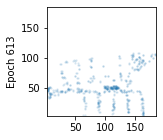

Epoch 614 elbo -6.647104


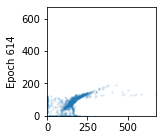

Reconstruction:


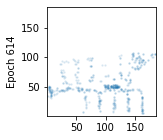

Epoch 615 elbo -6.561377


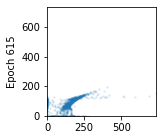

Reconstruction:


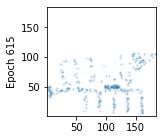

Epoch 616 elbo -6.4530754


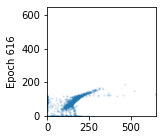

Reconstruction:


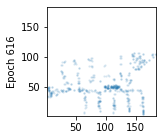

Epoch 617 elbo -6.4382396


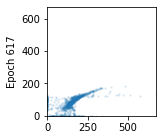

Reconstruction:


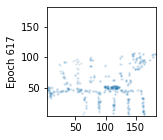

Epoch 618 elbo -6.638384


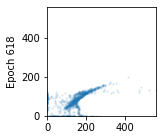

Reconstruction:


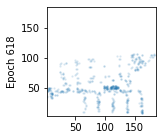

Epoch 619 elbo -8.338835


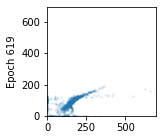

Reconstruction:


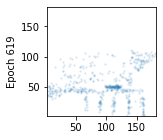

Epoch 620 elbo -7.8473444


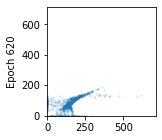

Reconstruction:


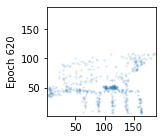

Epoch 621 elbo -7.750698


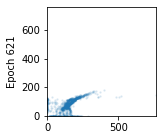

Reconstruction:


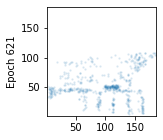

Epoch 622 elbo -6.5413804


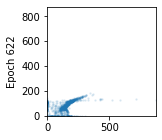

Reconstruction:


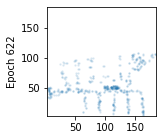

Epoch 623 elbo -7.3174887


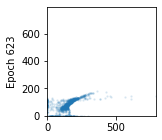

Reconstruction:


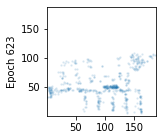

Epoch 624 elbo -6.5951767


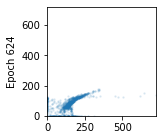

Reconstruction:


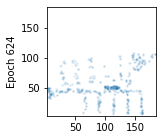

Epoch 625 elbo -6.6110125


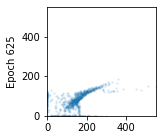

Reconstruction:


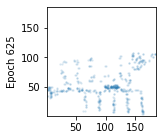

Epoch 626 elbo -8.392229


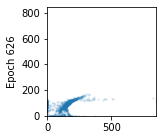

Reconstruction:


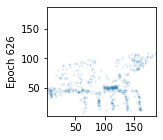

Epoch 627 elbo -7.187468


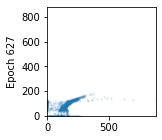

Reconstruction:


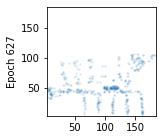

Epoch 628 elbo -6.578943


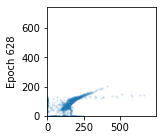

Reconstruction:


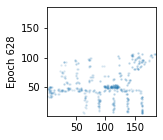

Epoch 629 elbo -8.854501


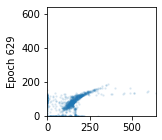

Reconstruction:


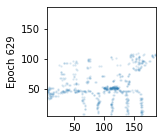

Epoch 630 elbo -6.488072


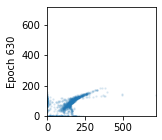

Reconstruction:


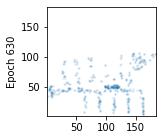

Epoch 631 elbo -6.3459625


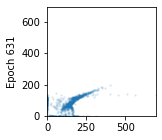

Reconstruction:


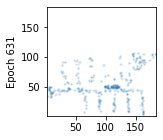

Epoch 632 elbo -6.639695


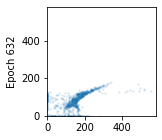

Reconstruction:


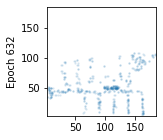

Epoch 633 elbo -6.480902


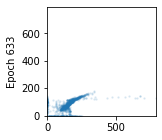

Reconstruction:


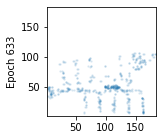

Epoch 634 elbo -8.185349


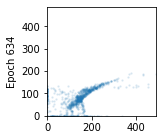

Reconstruction:


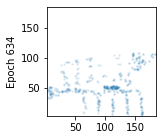

Epoch 635 elbo -6.6012144


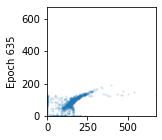

Reconstruction:


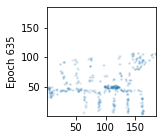

Epoch 636 elbo -8.78955


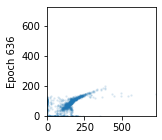

Reconstruction:


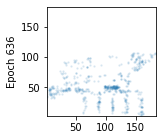

Epoch 637 elbo -6.6159954


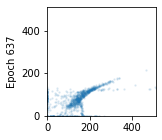

Reconstruction:


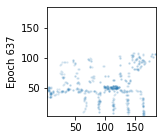

Epoch 638 elbo -7.4677944


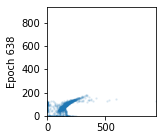

Reconstruction:


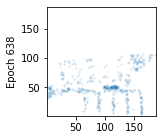

Epoch 639 elbo -7.7718325


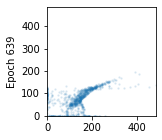

Reconstruction:


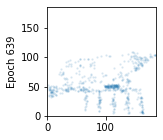

Epoch 640 elbo -8.600701


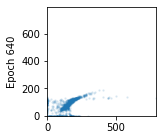

Reconstruction:


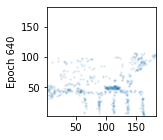

Epoch 641 elbo -6.4161997


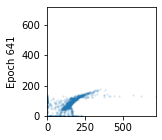

Reconstruction:


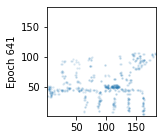

Epoch 642 elbo -6.6353054


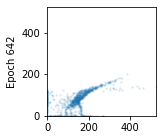

Reconstruction:


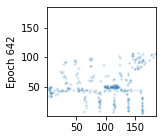

Epoch 643 elbo -6.285414


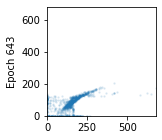

Reconstruction:


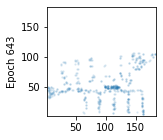

Epoch 644 elbo -6.6459823


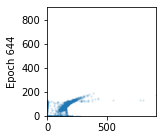

Reconstruction:


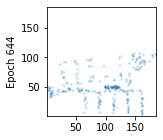

Epoch 645 elbo -6.5794272


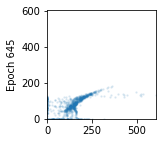

Reconstruction:


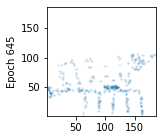

Epoch 646 elbo -6.501468


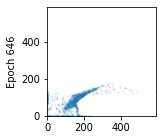

Reconstruction:


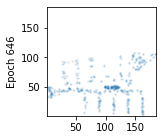

Epoch 647 elbo -8.429597


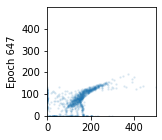

Reconstruction:


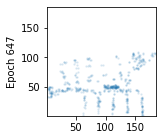

Epoch 648 elbo -6.65689


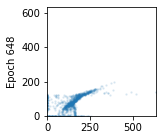

Reconstruction:


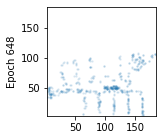

Epoch 649 elbo -7.0230746


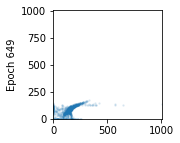

Reconstruction:


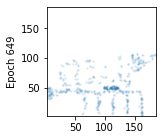

Epoch 650 elbo -6.45163


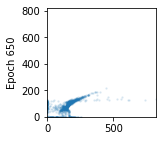

Reconstruction:


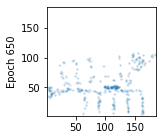

Epoch 651 elbo -6.4879947


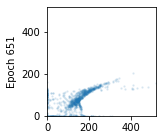

Reconstruction:


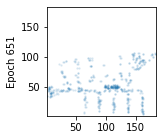

Epoch 652 elbo -7.5646605


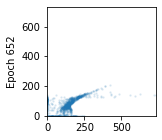

Reconstruction:


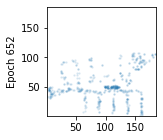

Epoch 653 elbo -6.829826


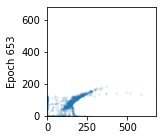

Reconstruction:


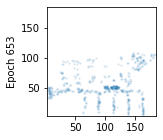

Epoch 654 elbo -7.270351


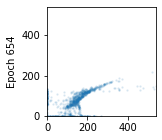

Reconstruction:


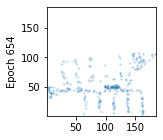

Epoch 655 elbo -6.2687836


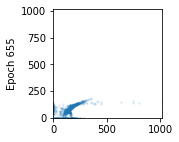

Reconstruction:


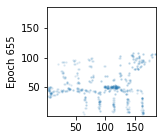

Epoch 656 elbo -7.1801724


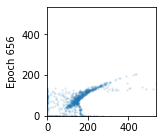

Reconstruction:


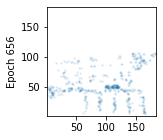

Epoch 657 elbo -7.396001


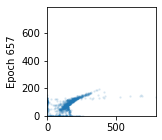

Reconstruction:


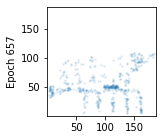

Epoch 658 elbo -6.3951116


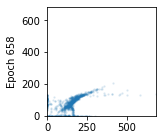

Reconstruction:


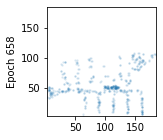

Epoch 659 elbo -7.706209


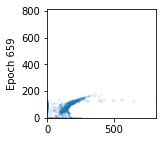

Reconstruction:


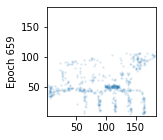

Epoch 660 elbo -6.797901


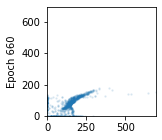

Reconstruction:


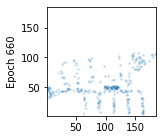

Epoch 661 elbo -7.521259


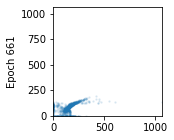

Reconstruction:


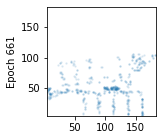

Epoch 662 elbo -6.6189365


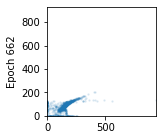

Reconstruction:


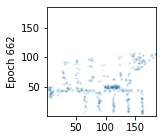

Epoch 663 elbo -6.491604


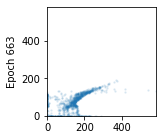

Reconstruction:


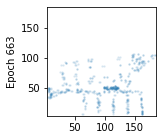

Epoch 664 elbo -7.1343246


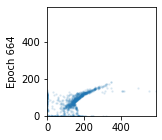

Reconstruction:


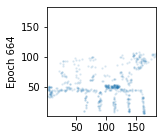

Epoch 665 elbo -6.2978354


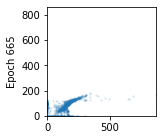

Reconstruction:


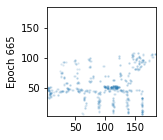

Epoch 666 elbo -7.5800457


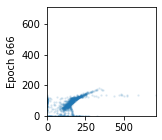

Reconstruction:


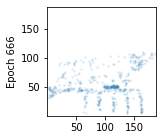

Epoch 667 elbo -6.7355633


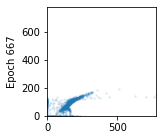

Reconstruction:


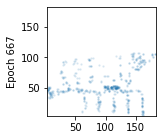

Epoch 668 elbo -6.507816


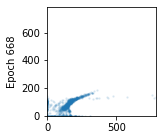

Reconstruction:


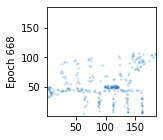

Epoch 669 elbo -6.573241


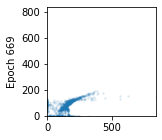

Reconstruction:


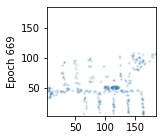

Epoch 670 elbo -7.107871


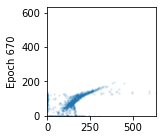

Reconstruction:


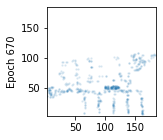

Epoch 671 elbo -6.4080944


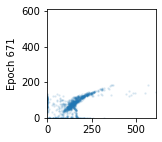

Reconstruction:


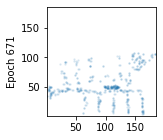

KeyboardInterrupt: 

In [6]:
samples, _ = make_decoder(prior.sample(1000), [2])
s1_5k, _ = make_decoder(prior.sample(1500), [2])
s2k, _ = make_decoder(prior.sample(2000), [2])
s3k, _ = make_decoder(prior.sample(3000), [2])
s5k, _ = make_decoder(prior.sample(5000), [2])
s10k, _ = make_decoder(prior.sample(10000), [2])

t1_5k = None
t2k = None
t3k = None
t5k = None
t10k = None

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    for epoch in range(5000):
        test_elbo, test_codes, test_samples, test_loc, t1_5k, t2k, t3k, t5k, t10k = sess.run([elbo, code, samples, loc, s1_5k, s2k, s3k, s5k, s10k], {data: X_test})
        print('Epoch', epoch, 'elbo', test_elbo)
        plot(epoch, test_samples, size=2)
        print('Reconstruction:')
        plot(epoch, test_loc, size=2)
        for _ in range(600):
            indices = np.random.choice(X_train.shape[0], 128)
            batch = X_train[indices]
            sess.run(optimize, {data: batch})

In [8]:
def people_in_area(samples):
    in_area = []
    for sample in samples:
        x = sample[0]
        y = sample[1]
        if x > 130 and x < 150 and y > 50 and y < 70: in_area.append(sample)
    print(len(in_area))
    
people_in_area(t1_5k)
people_in_area(t2k)
people_in_area(t3k)
people_in_area(t5k)
people_in_area(t10k)


83
93
134
210
452
